In [116]:

import sys,os
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
from src.utils.pg import PgClass
from src.constants import project_dir, DATABASE_DB, DATABASE_USER, DATABASE_PW, DATABASE_HOST, DATABASE_PORT

import pandas as pd
import numpy as np
import tensorflow as tf
from scipy.stats import rankdata

from dateutil.relativedelta import relativedelta
import datetime
import holidays

from statsmodels.tsa.api import VAR
from statsmodels.tsa.stattools import adfuller
from statsmodels.tools.eval_measures import rmse, aic
import statsmodels.api as sm

import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.graph_objects as go
import plotly.express as px

from itertools import cycle


import IPython
import IPython.display
from IPython.display import display, HTML, Markdown
from IPython.display import clear_output
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x:'%.4f'%x)
import warnings
warnings.filterwarnings("ignore")



In [117]:
# import yfinance as yf
# import pandas as pd

# class YfClass:
#     def __init__(self, tickers_list):
#         self.tickers_list = tickers_list
#         self.tickers_str = ' '.join(self.tickers_list)
#         print()
#         self.tickers = yf.Tickers(self.tickers_str)

#     def get_tickers_history(self, period):
#         hist_df = pd.DataFrame()
#         for ticker in self.tickers_list:
#             print(f'Get history of {ticker}')
#             hist_df_sub = getattr(self.tickers.tickers, ticker).history(period=period)
#             hist_df_sub['ticker'] = ticker
#             hist_df = hist_df.append(hist_df_sub)
#         hist_df.columns = [i.lower().replace(' ', '_') for i in hist_df.columns]
#         hist_df.reset_index(drop=False, inplace=True)
#         hist_df = hist_df.rename(columns={'Date': 'activity_date'})
#         hist_df['activity_date'] = hist_df.activity_date.dt.date
#         hist_df = hist_df[['ticker', 'activity_date', 'open', 'high', 'low', 'close', 'volume', 'dividends', 'stock_splits']]
#         return hist_df

In [118]:
# a = YfClass(['MSFT', 'GOOG'])

In [119]:
# import quandl
# import pandas as pd

# class QuanClass:
#     def __init__(self, quandl_api, tickers_list):
#         self.quandl = quandl
#         self.quandl.ApiConfig.api_key = quandl_api
#         self.tickers_list = tickers_list
#         self.tickers_str = ','.join(self.tickers_list)
#         self.data = self.quandl.get_table('QUOTEMEDIA/PRICES',
# #                                              date=','.join(pd.date_range(start='1/1/2021', end=pd.to_datetime('today'), freq='D').strftime('%Y-%m-%d').tolist()),
                                          
#                                           date='2021-01-01',ticker=self.tickers_str)

        


In [120]:
# b=QuanClass('VBy2hgjBv5rzipiJTJ4n',['BABA','GOOL'])

In [121]:
import requests
import json
td_consumer_key ='9CJZISHWQC9MI1REMVA2PJL1FGMBSYLI'
endpoint = 'https://api.tdameritrade.com/v1/marketdata/{stock_ticker}/pricehistory?periodType={periodType}&period={period}&frequencyType={frequencyType}&frequency={frequency}'
full_url = endpoint.format(stock_ticker='AAL',periodType='year',period=1,frequencyType='daily',frequency=1)
page = requests.get(url=full_url,
                    params={'apikey' : td_consumer_key})
content = json.loads(page.content)

In [122]:
content['candles']

[{'open': 12.6,
  'high': 13.29,
  'low': 12.42,
  'close': 13.15,
  'volume': 90788939,
  'datetime': 1603342800000},
 {'open': 13.07,
  'high': 13.08,
  'low': 12.42,
  'close': 12.6,
  'volume': 90787924,
  'datetime': 1603429200000},
 {'open': 12.39,
  'high': 12.45,
  'low': 11.67,
  'close': 11.8,
  'volume': 85349599,
  'datetime': 1603688400000},
 {'open': 11.77,
  'high': 11.79,
  'low': 11.2,
  'close': 11.23,
  'volume': 65803386,
  'datetime': 1603774800000},
 {'open': 10.89,
  'high': 11.16,
  'low': 10.63,
  'close': 10.95,
  'volume': 64399820,
  'datetime': 1603861200000},
 {'open': 10.96,
  'high': 11.29,
  'low': 10.89,
  'close': 11.16,
  'volume': 44070630,
  'datetime': 1603947600000},
 {'open': 11.06,
  'high': 11.415,
  'low': 10.98,
  'close': 11.28,
  'volume': 51348328,
  'datetime': 1604034000000},
 {'open': 11.32,
  'high': 11.34,
  'low': 10.87,
  'close': 11.19,
  'volume': 41094537,
  'datetime': 1604296800000},
 {'open': 11.34,
  'high': 11.45,
  'low': 

In [123]:
pg_conn = PgClass(DATABASE_DB, DATABASE_USER, DATABASE_PW, DATABASE_HOST, DATABASE_PORT)


In [124]:
#configurations

start_date = '2014-01-01'
train_start_date_input, train_end_date_input = datetime.date(2014, 1, 1), datetime.datetime.today().date()
n_forecast =90
n_input_width=90
# one of 'VOX', 'VCR', 'VDC', 'VDE', 'VFH', 'VHT', 'VIS', 'VGT', 'VAW', 'VNQ', 'VPU', 'QQQ'
target_etf = 'VOO'


## Collect data

In [125]:
leading_q = f"""
SELECT fc.metric, activity_date, value, frequency, title
FROM fred.fact_metric fc
JOIN fred.dim_metric dim
ON fc.metric = dim.metric
WHERE activity_date >='{start_date}'
AND fc.metric in ('M2', 'T10YFF', 'DGS10', 'SP500', 'UMCSENT', 'PERMIT','ANDENO','AWHAEMAN','DTCDISA066MSFRBNY','DCOILWTICO'
--,'ICSA'
);
             """
leading_df = pd.read_sql_query(leading_q, pg_conn.connection)

In [126]:
etf_q = f"""
select ticker, activity_date, close
from stock.fact_stock_price
where activity_date >='{start_date}'
 and ticker in ('VOX', 'VCR', 'VDC', 'VDE', 'VFH', 'VHT', 'VIS', 'VGT', 'VAW', 'VNQ', 'VPU', 'QQQ', 'VOO', 'VTV', 'VIGAX', 'VO', 'VB')"""
etf_df = pd.read_sql_query(etf_q, pg_conn.connection)

In [127]:
# pivots the leading indicators and etf to predict
leading_metric_df = leading_df.groupby(['metric','frequency','title']
                                      ).count().index.to_frame(index=False, name=['metric','frequency','title'])
leading_pivoted = pd.pivot_table(leading_df, index='activity_date', columns='metric', values='value',aggfunc='sum').reset_index()

etf_pivoted = pd.pivot_table(etf_df, index='activity_date',columns='ticker',values='close',aggfunc='sum').reset_index()


In [128]:
data_df = etf_pivoted.merge(leading_pivoted, on=['activity_date'], how='outer')\
            .sort_values(by=['activity_date'])\
            .reset_index(drop=True)

In [129]:
data_df = data_df.set_index('activity_date').asfreq('D')
data_df.index = data_df.index.date
etf_list = etf_df.ticker.unique().tolist()
# TODO:
# etf_list=['VFH']
leading_metric_list = leading_metric_df.metric.unique().tolist()
# replace the fred metric with 0 value to null
data_df = data_df.replace(0,np.nan)
# forwardfill then backwardfill null value to fill all null value
data_df = data_df.fillna(method='ffill').dropna()

In [130]:
# create date_features
data_df['weekday']=data_df.index.map(lambda x:x.weekday())
data_df['is_weekend'] = np.where(data_df['weekday'].isin([0,6]),1,0)
us_holidays = holidays.UnitedStates()
data_df['is_holiday']=data_df.index.map(lambda x: 1 if x in us_holidays else 0)
date_feature_list = ['weekday','is_weekend','is_holiday']

## Explore Data

In [131]:
def plot_trends(df):
    for i in df.columns:
        plt.figure(figsize=(6,2))
        plt.plot(df.index, df[i])
        plt.title(i)
        plt.show()

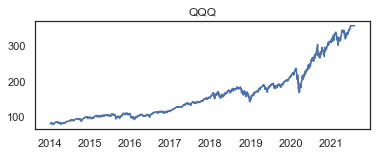

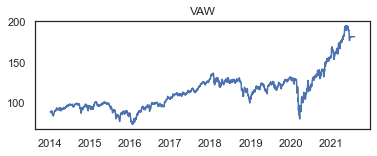

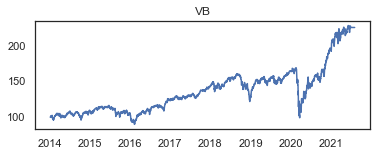

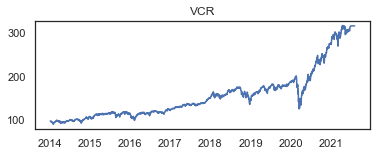

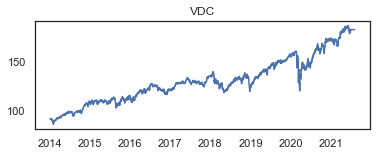

...

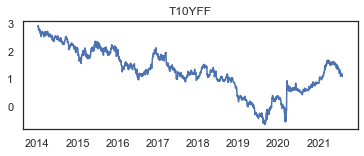

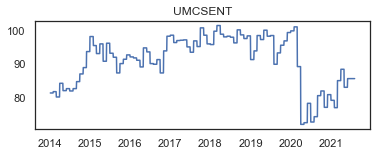

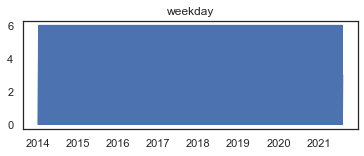

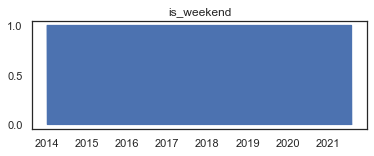

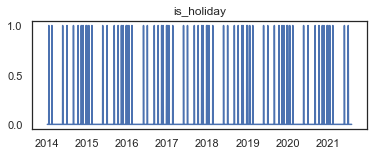

In [132]:
plot_trends(data_df)

<AxesSubplot:>

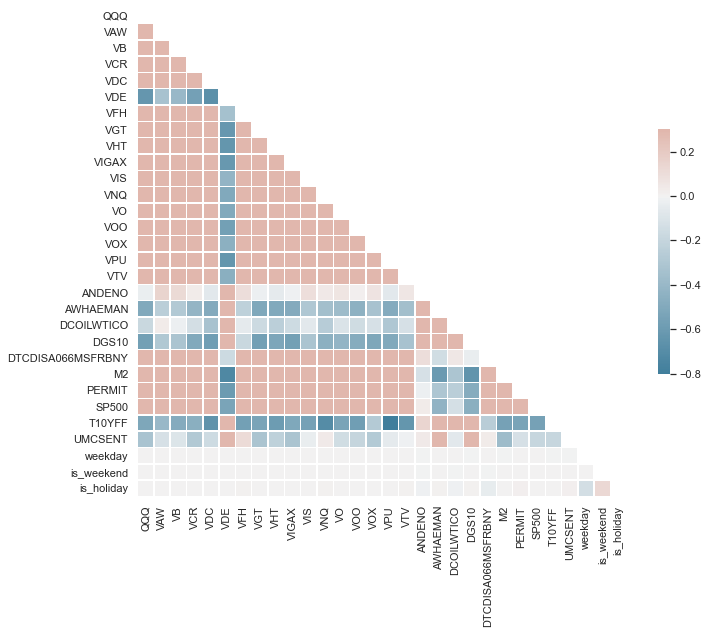

In [133]:
# correlation matrix
sns.set_theme(style="white")


# Compute the correlation matrix
corr = data_df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [134]:
# corr[target_etf].sort_values()

## Create dataset for prediction

In [135]:
# use related data for model
data_start_date = data_df.index.min()
data_end_date = data_df.index.max()
train_start_date = max(data_start_date, train_start_date_input) 
train_end_date = min(data_end_date, train_end_date_input)
# for deep learning model in this Notebook, the forecast period is decided by n_input_width rather than n_forecast
forecast_start_date, forecast_end_date = train_end_date+relativedelta(days=1), train_end_date+relativedelta(days=1+n_forecast)



df = data_df.loc[(data_df.index>= train_start_date) & (data_df.index<= train_end_date),
             etf_list+leading_metric_list+date_feature_list].copy()


## VAR

In [136]:
diff_order = 1
diff_df = df.diff(diff_order).dropna()
diff_df.columns = [ i +'_diff' for i in diff_df.columns]

In [137]:
# Stationary test
def adfuller_test(series, signif=0.05, name='', verbose=False):
    """Perform ADFuller to test for Stationarity of given series and print report"""
    r = adfuller(series, autolag='AIC')
    output = {'test_statistic':round(r[0], 4), 'pvalue':round(r[1], 4), 'n_lags':round(r[2], 4), 'n_obs':r[3]}
    p_value = output['pvalue'] 
    def adjust(val, length= 6): return str(val).ljust(length)

    # Print Summary
    print(f'    Augmented Dickey-Fuller Test on "{name}"', "\n   ", '-'*47)
    print(f' Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f' Significance Level    = {signif}')
    print(f' Test Statistic        = {output["test_statistic"]}')
    print(f' No. Lags Chosen       = {output["n_lags"]}')

    for key,val in r[4].items():
        print(f' Critical value {adjust(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f" => Series is Stationary.")
    else:
        print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
        print(f" => Series is Non-Stationary.")  

for name, column in diff_df.iteritems():
    adfuller_test(column, name=column.name)
    print('\n')

    Augmented Dickey-Fuller Test on "VOX_diff" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -10.5244
 No. Lags Chosen       = 23
 Critical value 1%     = -3.433
 Critical value 5%     = -2.863
 Critical value 10%    = -2.567
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "VCR_diff" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -10.4321
 No. Lags Chosen       = 24
 Critical value 1%     = -3.433
 Critical value 5%     = -2.863
 Critical value 10%    = -2.567
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "VDC_diff" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance 

    Augmented Dickey-Fuller Test on "DTCDISA066MSFRBNY_diff" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -52.5885
 No. Lags Chosen       = 0
 Critical value 1%     = -3.433
 Critical value 5%     = -2.863
 Critical value 10%    = -2.567
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "M2_diff" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -5.0033
 No. Lags Chosen       = 27
 Critical value 1%     = -3.433
 Critical value 5%     = -2.863
 Critical value 10%    = -2.567
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "PERMIT_diff" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.


In [138]:
def test_stationarity(timeseries, label, title):
    '''
    function to test  stationary
    '''
    #Determing rolling statistics
    rolmean = timeseries.rolling(window=7).mean()
    rolstd = timeseries.rolling(window=7).std()

    #Plot rolling statistics:
    plt.figure(figsize=(10,6))
    orig = plt.plot(timeseries, color='black',label=label)
    #mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    #std = plt.plot(rolstd, color='green', label = 'Rolling Std')
    plt.xticks(rotation=90)
    plt.legend(loc='best')
    plt.title(title)
    plt.show()
    
    #Perform Dickey-Fuller test:
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in list(dftest[4].items()):
        dfoutput['Critical Value (%s)'%key] = value
    if dfoutput['p-value']<=0.05:
        conclusion = "stationary"
    else:
        conclusion = "not stationary"
    print("Dickey-Fuller Test: " + conclusion)
    dfoutput = dfoutput.reset_index()
    dfoutput.columns=['metric', 'value']
    display(HTML(dfoutput.to_html()))
    
    return


VOX_diff


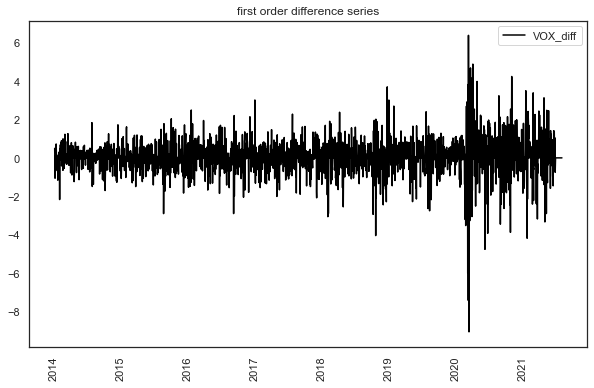

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-10.5244
1,p-value,0.0000
2,#Lags Used,23.0000
3,Number of Observations Used,2744.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


VCR_diff


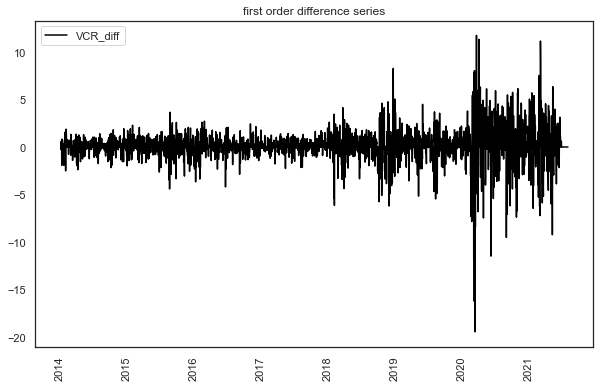

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-10.4321
1,p-value,0.0000
2,#Lags Used,24.0000
3,Number of Observations Used,2743.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


VDC_diff


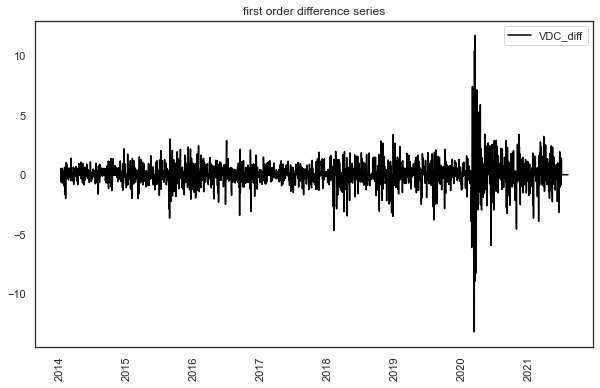

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-11.6268
1,p-value,0.0000
2,#Lags Used,24.0000
3,Number of Observations Used,2743.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


VDE_diff


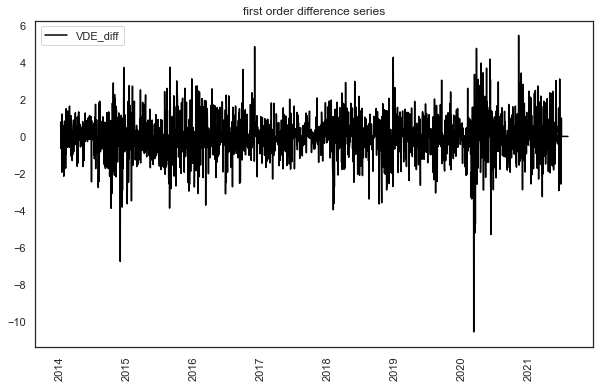

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-36.3787
1,p-value,0.0000
2,#Lags Used,1.0000
3,Number of Observations Used,2766.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


VFH_diff


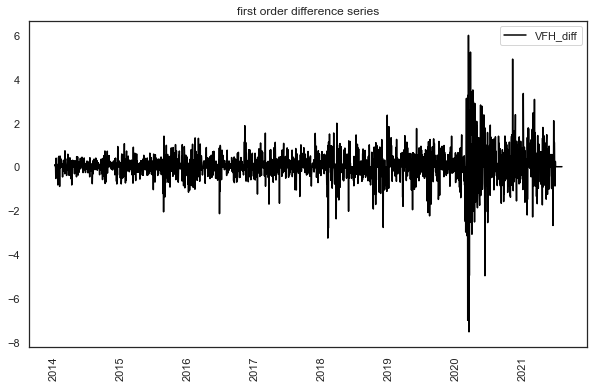

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-13.0290
1,p-value,0.0000
2,#Lags Used,13.0000
3,Number of Observations Used,2754.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


VHT_diff


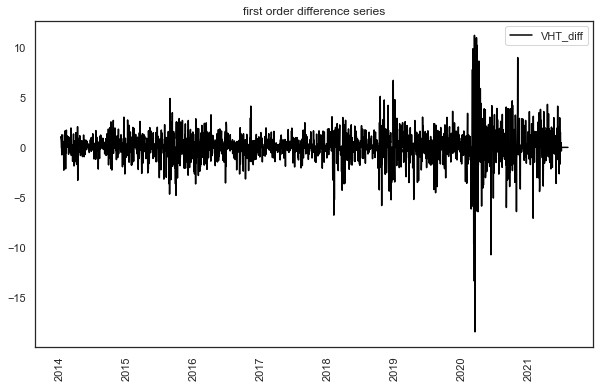

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-11.6407
1,p-value,0.0000
2,#Lags Used,22.0000
3,Number of Observations Used,2745.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


VIS_diff


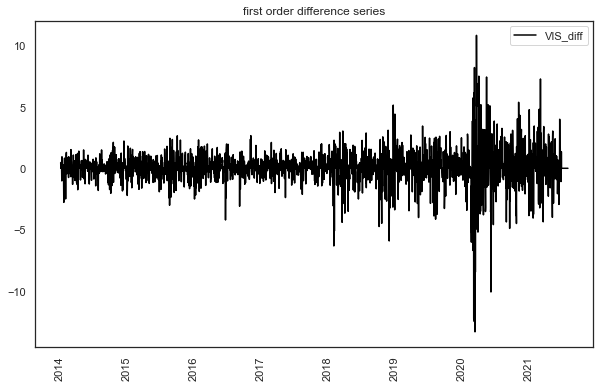

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-13.3570
1,p-value,0.0000
2,#Lags Used,13.0000
3,Number of Observations Used,2754.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


VGT_diff


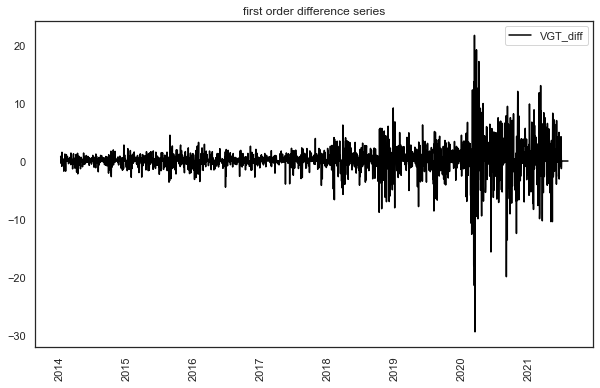

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-10.4101
1,p-value,0.0000
2,#Lags Used,23.0000
3,Number of Observations Used,2744.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


VAW_diff


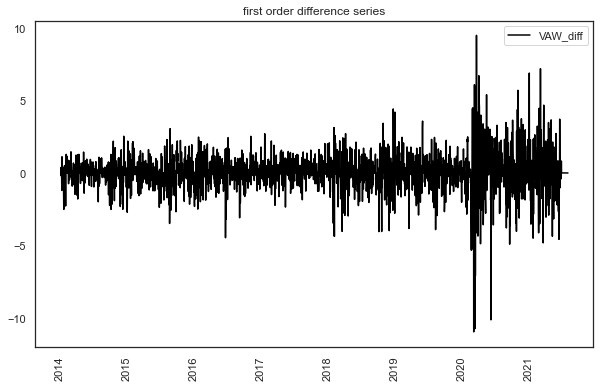

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-15.1786
1,p-value,0.0000
2,#Lags Used,11.0000
3,Number of Observations Used,2756.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


VNQ_diff


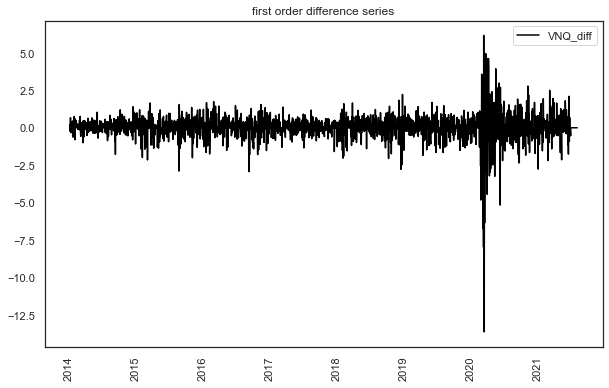

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-11.2190
1,p-value,0.0000
2,#Lags Used,27.0000
3,Number of Observations Used,2740.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


VPU_diff


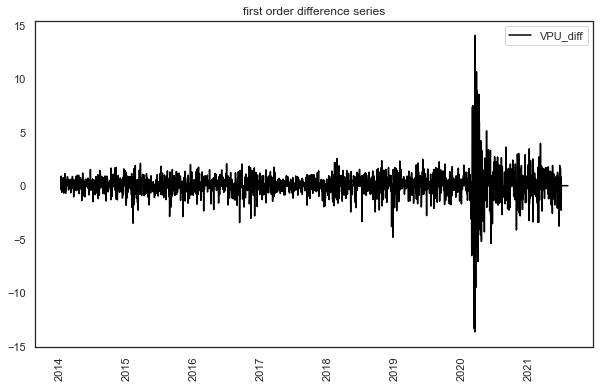

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-11.9791
1,p-value,0.0000
2,#Lags Used,28.0000
3,Number of Observations Used,2739.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


VTV_diff


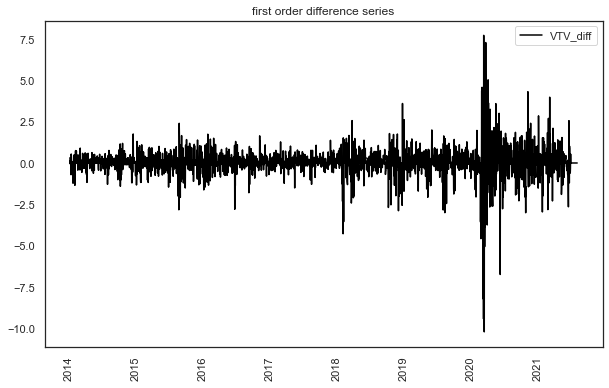

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-10.8335
1,p-value,0.0000
2,#Lags Used,26.0000
3,Number of Observations Used,2741.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


VIGAX_diff


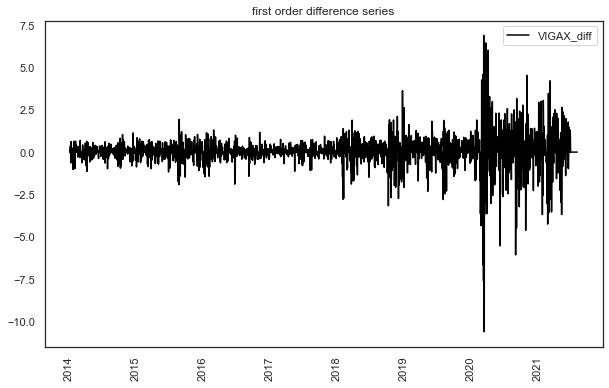

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-10.3074
1,p-value,0.0000
2,#Lags Used,23.0000
3,Number of Observations Used,2744.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


QQQ_diff


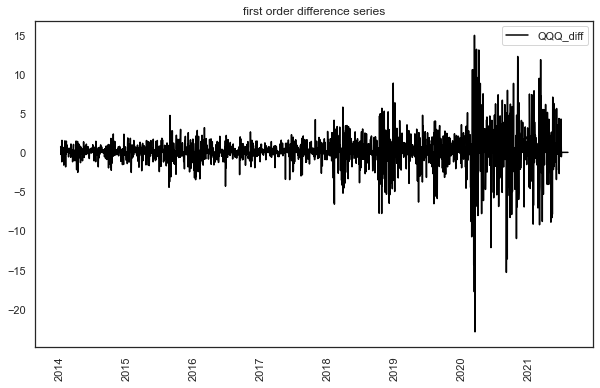

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-10.4925
1,p-value,0.0000
2,#Lags Used,23.0000
3,Number of Observations Used,2744.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


VOO_diff


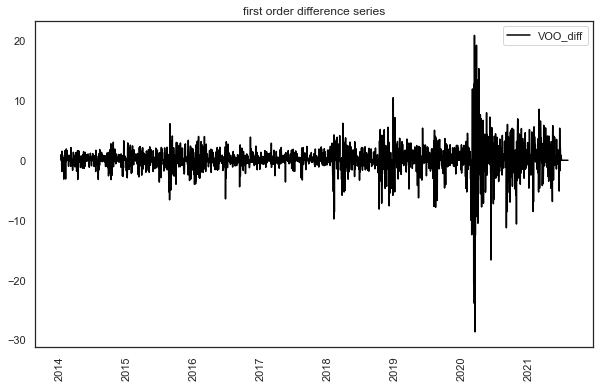

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-10.7272
1,p-value,0.0000
2,#Lags Used,22.0000
3,Number of Observations Used,2745.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


VO_diff


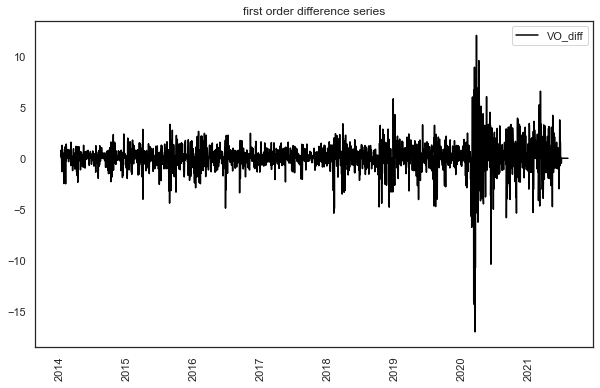

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-10.5753
1,p-value,0.0000
2,#Lags Used,26.0000
3,Number of Observations Used,2741.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


VB_diff


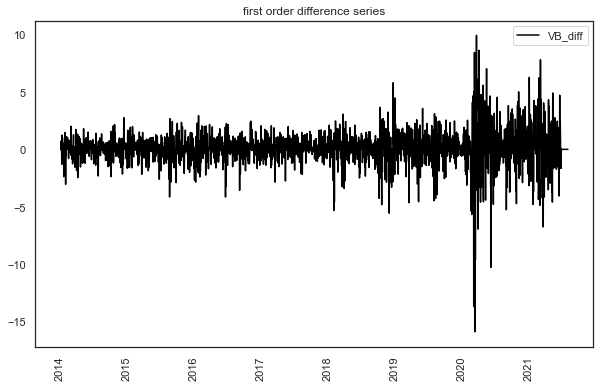

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-10.5721
1,p-value,0.0000
2,#Lags Used,22.0000
3,Number of Observations Used,2745.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


ANDENO_diff


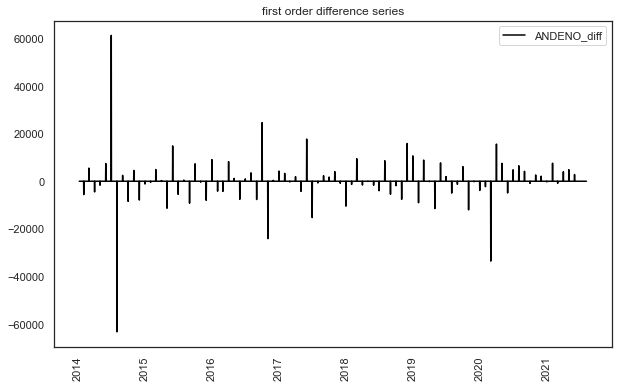

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-52.5833
1,p-value,0.0000
2,#Lags Used,0.0000
3,Number of Observations Used,2767.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


AWHAEMAN_diff


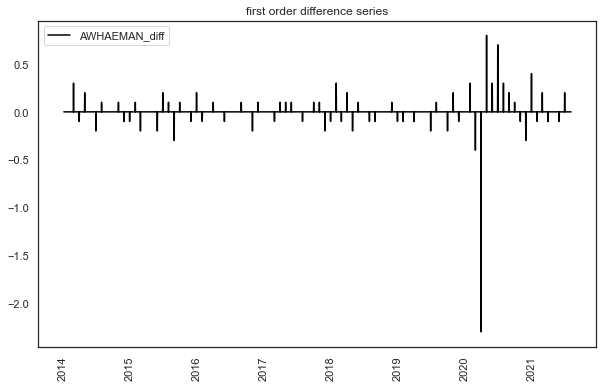

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-52.5834
1,p-value,0.0000
2,#Lags Used,0.0000
3,Number of Observations Used,2767.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


DCOILWTICO_diff


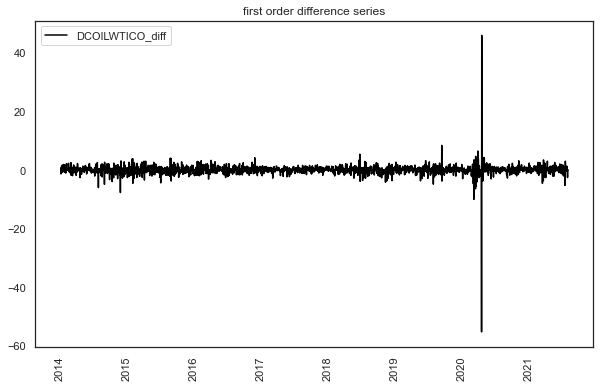

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-11.0142
1,p-value,0.0000
2,#Lags Used,20.0000
3,Number of Observations Used,2747.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


DGS10_diff


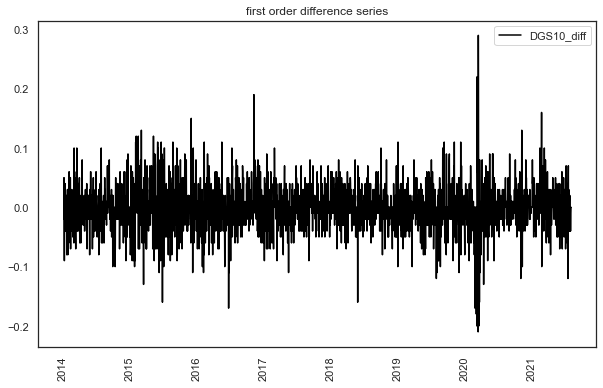

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-53.7580
1,p-value,0.0000
2,#Lags Used,0.0000
3,Number of Observations Used,2767.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


DTCDISA066MSFRBNY_diff


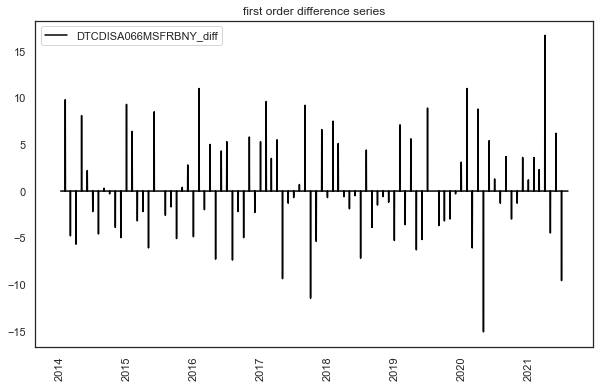

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-52.5885
1,p-value,0.0000
2,#Lags Used,0.0000
3,Number of Observations Used,2767.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


M2_diff


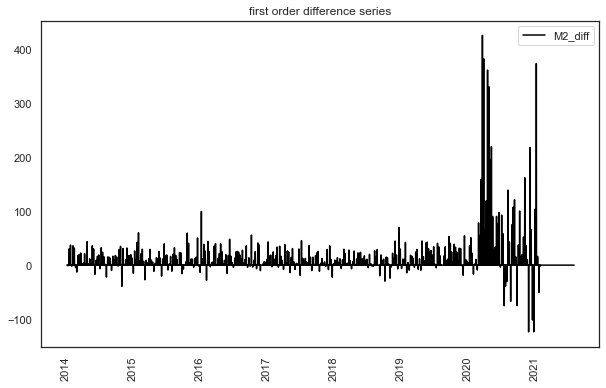

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-5.0033
1,p-value,0.0000
2,#Lags Used,27.0000
3,Number of Observations Used,2740.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


PERMIT_diff


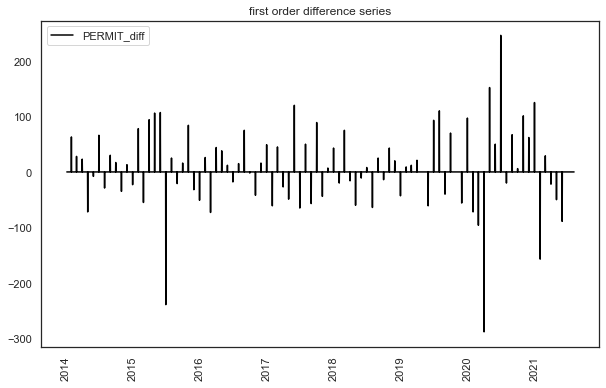

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-52.5975
1,p-value,0.0000
2,#Lags Used,0.0000
3,Number of Observations Used,2767.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


SP500_diff


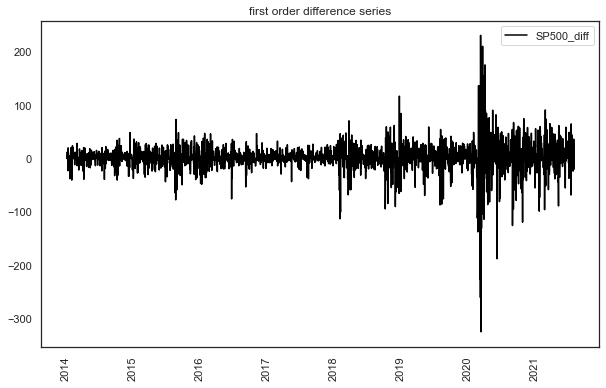

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-10.7364
1,p-value,0.0000
2,#Lags Used,22.0000
3,Number of Observations Used,2745.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


T10YFF_diff


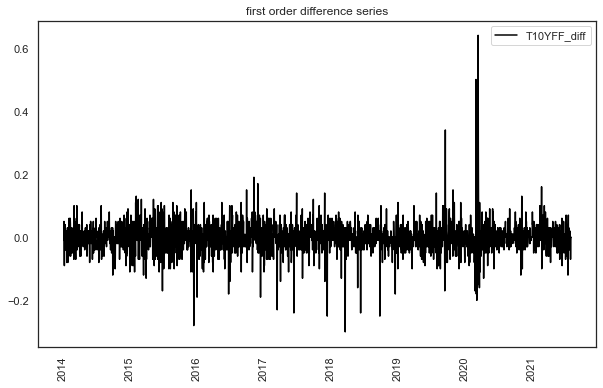

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-11.7597
1,p-value,0.0000
2,#Lags Used,22.0000
3,Number of Observations Used,2745.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


UMCSENT_diff


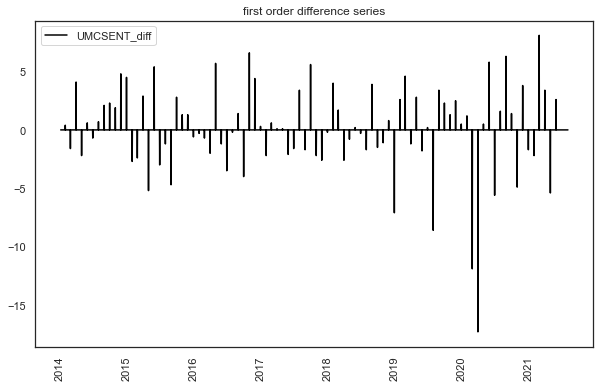

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-52.5835
1,p-value,0.0000
2,#Lags Used,0.0000
3,Number of Observations Used,2767.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


weekday_diff


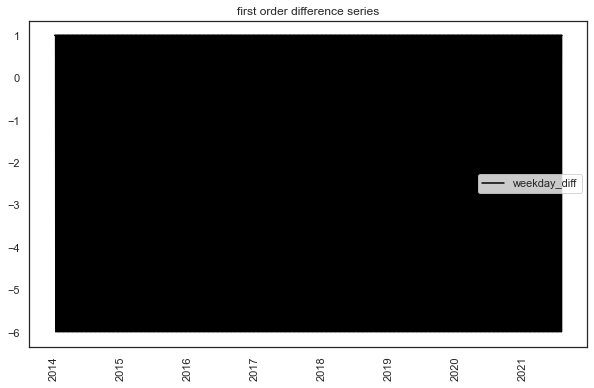

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-2614988239480246.0000
1,p-value,0.0000
2,#Lags Used,5.0000
3,Number of Observations Used,2762.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


is_weekend_diff


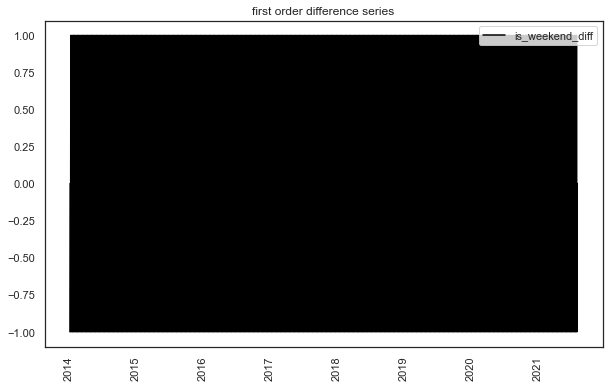

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-4301450794314856.0000
1,p-value,0.0000
2,#Lags Used,5.0000
3,Number of Observations Used,2762.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


is_holiday_diff


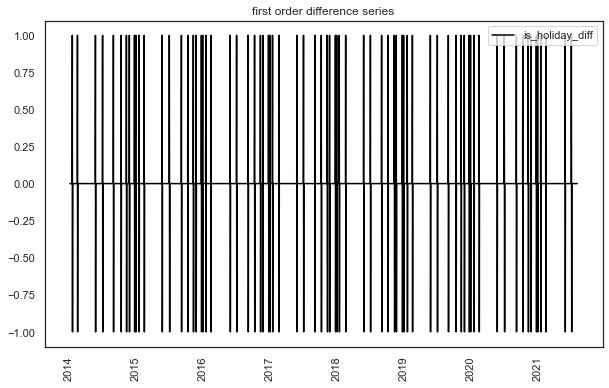

Dickey-Fuller Test: stationary


,metric,value
0,Test Statistic,-17.7994
1,p-value,0.0000
2,#Lags Used,28.0000
3,Number of Observations Used,2739.0000
4,Critical Value (1%),-3.4327
5,Critical Value (5%),-2.8626
6,Critical Value (10%),-2.5673


In [139]:
_ = diff_df
for col in _.columns:
    print(col)
    test_stationarity(_[col], label=col, title='first order difference series')


## VAR model

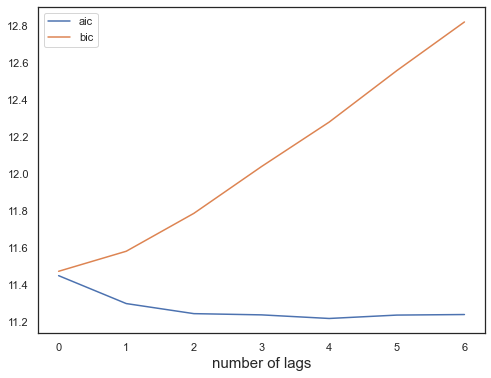

In [140]:

train_df_var = diff_df[[target_etf+"_diff"]+[i+'_diff' for i in leading_metric_list]].copy()

model = VAR(train_df_var)
aic, bic = [], []

x = np.arange(7)
for i in x:
    result = model.fit(i)
    aic.append(result.aic)
    bic.append(result.bic)

plt.figure(figsize=(8,6))
plt.plot(x, aic, label='aic')
plt.plot(x, bic, label='bic')
plt.xlabel("number of lags", fontsize=15)
plt.legend()
plt.show()


In [141]:
# actually, this is not a good example of using VAR model
maxlags = 7
model_result_var = model.fit(maxlags=maxlags, ic = 'bic', trend = 'c')  #do not use linear trend since it stationarized after differencing
num_lag_chosen = model_result_var.k_ar
print(num_lag_chosen)

print(model_result_var.summary())


0
  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 24, Oct, 2021
Time:                     13:46:36
--------------------------------------------------------------------
No. of Equations:         11.0000    BIC:                    11.4751
Nobs:                     2768.00    HQIC:                   11.4600
Log likelihood:          -59041.8    FPE:                    94044.9
AIC:                      11.4515    Det(Omega_mle):         93671.9
--------------------------------------------------------------------
Results for equation VOO_diff
           coefficient       std. error           t-stat            prob
------------------------------------------------------------------------
const         0.089310         0.041223            2.166           0.030

Results for equation ANDENO_diff
           coefficient       std. error           t-stat            prob
-----------------------------------------------------

## Tensorflow Models
This part is mainly copied from this [page](https://www.tensorflow.org/tutorials/structured_data/time_series#top_of_page). I changed the data transformation method to make the time series stationary.

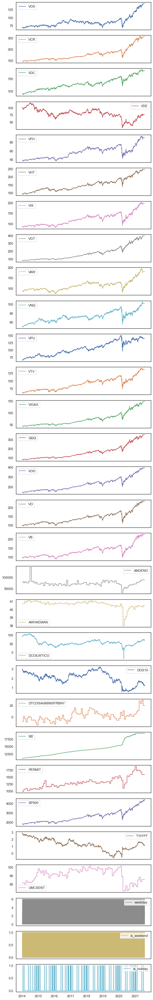

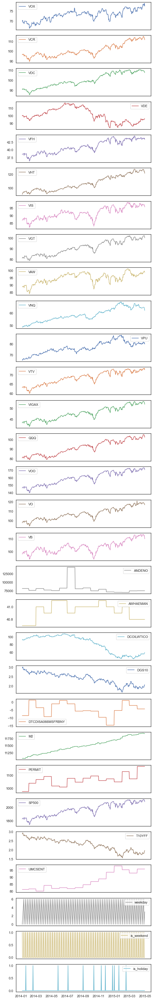

In [142]:

plot_cols = etf_list+leading_metric_list+date_feature_list
mpl.rcParams['figure.figsize'] = (8, len(plot_cols)*2)
mpl.rcParams['axes.grid'] = False

plot_features = df[plot_cols]
# plot_features.index = date_time
_ = plot_features.plot(subplots=True)

plot_features = df[plot_cols][:480]
# plot_features.index = date_time[:480]
_ = plot_features.plot(subplots=True)

mpl.rcParams['figure.figsize'] = (8, 6)


In [143]:
df.describe().transpose()


,count,mean,std,min,25%,50%,75%,max
VOX,2769.0000,87.4579,16.5639,66.3150,75.9682,84.3761,89.7236,144.8900
VCR,2769.0000,155.1874,56.7208,89.5402,113.8161,137.4407,173.8632,314.8800
VDC,2769.0000,130.1171,23.3119,85.5232,111.7646,127.6077,144.6023,186.6800
VDE,2769.0000,79.8072,16.4108,30.1825,72.9620,80.7475,90.3336,117.0020
VFH,2769.0000,56.6420,13.6974,36.3279,43.7121,57.2823,65.6075,94.4900
VHT,2769.0000,150.6406,38.9425,91.0168,120.6989,144.5473,169.3771,247.5700
VIS,2769.0000,122.5669,28.9111,82.2855,95.8613,120.7611,139.1324,201.9800
VGT,2769.0000,173.6104,86.6057,78.5967,101.2838,151.5058,212.4824,400.0800
VAW,2769.0000,114.7552,24.0728,73.7096,96.2565,112.5397,126.1283,194.4700
VNQ,2769.0000,72.3891,11.3721,48.8140,64.4329,71.4144,79.2507,105.5000


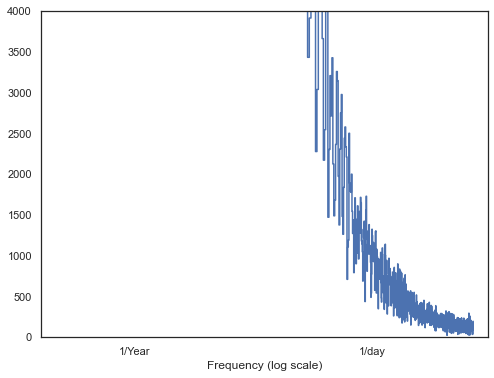

In [144]:
# determine which frequencies are important using an fft
fft = tf.signal.rfft(df[target_etf])
f_per_dataset = np.arange(0, len(fft))

n_samples_h = len(df[target_etf])
hours_per_year = 24*365.2524
years_per_dataset = n_samples_h/(hours_per_year)

f_per_year = f_per_dataset/years_per_dataset
plt.step(f_per_year, np.abs(fft))
plt.xscale('log')
plt.ylim(0, 4000)
plt.xlim([0.1, max(plt.xlim())])
plt.xticks([1, 365.2524], labels=['1/Year', '1/day'])
_ = plt.xlabel('Frequency (log scale)')

In [145]:
# split data
column_indices = {name: i for i, name in enumerate(df.columns)}

n = len(df)
train_df = df[0:int(n*0.7)].copy()
val_df = df[int(n*0.7):int(n*0.9)].copy()
test_df = df[int(n*0.9):].copy()

num_features = df.shape[1]


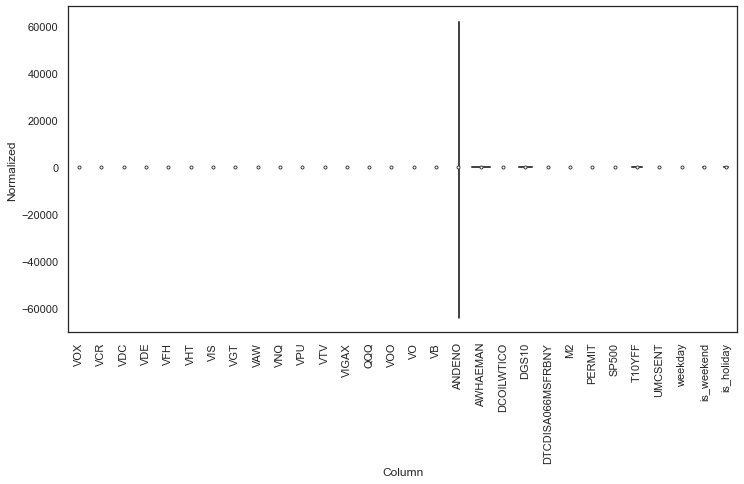

In [146]:
# # normalize data
# train_mean = train_df.mean()
# train_std = train_df.std()

# train_df = (train_df - train_mean) / train_std
# val_df = (val_df - train_mean) / train_std
# test_df = (test_df - train_mean) / train_std

# # check distribution
# df_std = (df - train_mean) / train_std
# df_std = df_std.melt(var_name='Column', value_name='Normalized')
# plt.figure(figsize=(12, 6))
# ax = sns.violinplot(x='Column', y='Normalized', data=df_std)
# _ = ax.set_xticklabels(df.keys(), rotation=90)

#  normalize data
# use one degree difference rather than normalization to improve the accuracy of prediction
train_mean = train_df.mean()
train_std = train_df.std()

train_df = train_df.diff(1).dropna()
val_df = val_df.diff(1).dropna()
test_df = test_df.diff(1).dropna()

# check distribution
df_std = df.diff(1).dropna()
df_std = df_std.melt(var_name='Column', value_name='Normalized')
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='Normalized', data=df_std)
_ = ax.set_xticklabels(df.keys(), rotation=90)



### Data Windowing

In [147]:
# generate window
class WindowGenerator():
    def __init__(self, input_width, label_width, shift,
               train_df=train_df, val_df=val_df, test_df=test_df,
               label_columns=None):
        # Store the raw data.
        self.train_df = train_df
        self.val_df = val_df
        self.test_df = test_df

        # Work out the label column indices.
        self.label_columns = label_columns
        if label_columns is not None:
            self.label_columns_indices = {name: i for i, name in
                                        enumerate(label_columns)}
        self.column_indices = {name: i for i, name in
                               enumerate(train_df.columns)}

        # Work out the window parameters.
        self.input_width = input_width
        self.label_width = label_width
        self.shift = shift

        self.total_window_size = input_width + shift

        self.input_slice = slice(0, input_width)
        self.input_indices = np.arange(self.total_window_size)[self.input_slice]

        self.label_start = self.total_window_size - self.label_width
        self.labels_slice = slice(self.label_start, None)
        self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

    def __repr__(self):
        return '\n'.join([
            f'Total window size: {self.total_window_size}',
            f'Input indices: {self.input_indices}',
            f'Label indices: {self.label_indices}',
            f'Label column name(s): {self.label_columns}'])

In [148]:
w1 = WindowGenerator(input_width=24, label_width=1, shift=24,
                     label_columns=[target_etf])
w1

Total window size: 48
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Label indices: [47]
Label column name(s): ['VOO']

In [149]:
w2 = WindowGenerator(input_width=n_input_width, label_width=1, shift=1,
                     label_columns=[target_etf])
w2

Total window size: 91
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89]
Label indices: [90]
Label column name(s): ['VOO']

In [150]:
def split_window(self, features):
    inputs = features[:, self.input_slice, :]
    labels = features[:, self.labels_slice, :]
    if self.label_columns is not None:
        labels = tf.stack(
        [labels[:, :, self.column_indices[name]] for name in self.label_columns],
        axis=-1)

    # Slicing doesn't preserve static shape information, so set the shapes
    # manually. This way the `tf.data.Datasets` are easier to inspect.
    inputs.set_shape([None, self.input_width, None])
    labels.set_shape([None, self.label_width, None])

    return inputs, labels

WindowGenerator.split_window = split_window

In [151]:
# Stack three slices, the length of the total window:
example_window = tf.stack([
    
                           np.array(train_df[-3*w2.total_window_size:-2*w2.total_window_size]),
                           np.array(train_df[-2*w2.total_window_size:-w2.total_window_size]),
                           np.array(train_df[-w2.total_window_size:])])


example_inputs, example_labels = w2.split_window(example_window)

print('All shapes are: (batch, time, features)')
print(f'Window shape: {example_window.shape}')
print(f'Inputs shape: {example_inputs.shape}')
print(f'labels shape: {example_labels.shape}')

All shapes are: (batch, time, features)
Window shape: (3, 91, 30)
Inputs shape: (3, 90, 30)
labels shape: (3, 1, 1)


In [152]:
w2.example = example_inputs, example_labels


In [153]:
def plot(self, model=None, plot_col='T (degC)', max_subplots=3):
    inputs, labels = self.example
    plt.figure(figsize=(12, 8))
    plot_col_index = self.column_indices[plot_col]
    max_n = min(max_subplots, len(inputs))
    for n in range(max_n):
        plt.subplot(max_n, 1, n+1)
        plt.ylabel(f'{plot_col} [normed]')
        plt.plot(self.input_indices, inputs[n, :, plot_col_index],
                 label='Inputs', marker='.', zorder=-10)

        if self.label_columns:
            label_col_index = self.label_columns_indices.get(plot_col, None)
        else:
            label_col_index = plot_col_index

        if label_col_index is None:
            continue

        plt.scatter(self.label_indices, labels[n, :, label_col_index],
                    edgecolors='k', label='Labels', c='#2ca02c', s=64)
        if model is not None:
            predictions = model(inputs)
            plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                      marker='X', edgecolors='k', label='Predictions',
                      c='#ff7f0e', s=64)

        if n == 0:
            plt.legend()

    plt.xlabel('Date [d]')

WindowGenerator.plot = plot

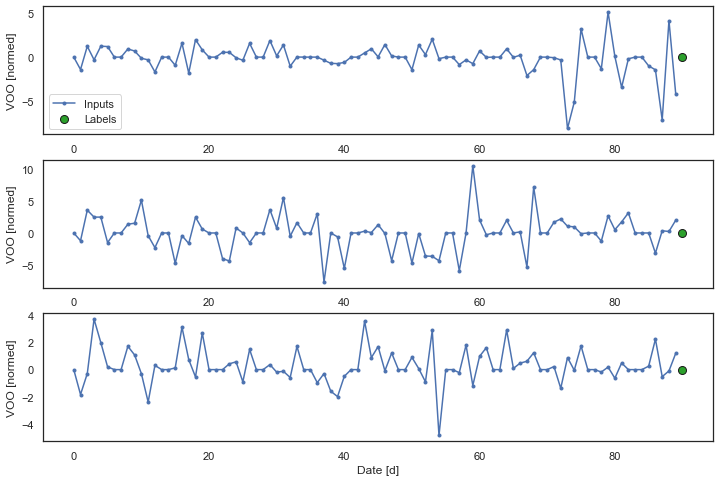

In [154]:
w2.plot(plot_col=target_etf,max_subplots=6)

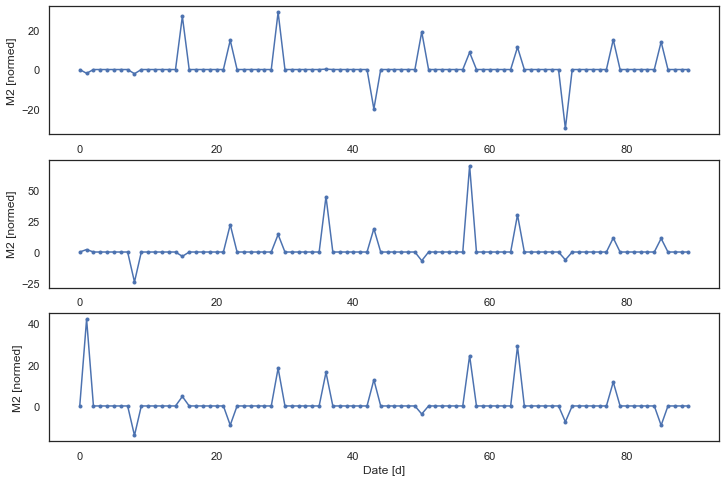

In [155]:
w2.plot(plot_col='M2')


In [156]:
def make_dataset(self, data):
    data = np.array(data, dtype=np.float32)
    ds = tf.keras.preprocessing.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=1,
      shuffle=True,
      batch_size=32,)

    ds = ds.map(self.split_window)

    return ds

WindowGenerator.make_dataset = make_dataset

In [157]:
@property
def train(self):
    return self.make_dataset(self.train_df)

@property
def val(self):
    return self.make_dataset(self.val_df)

@property
def test(self):
    return self.make_dataset(self.test_df)

@property
def example(self):
    """Get and cache an example batch of `inputs, labels` for plotting."""
    result = getattr(self, '_example', None)
    if result is None:
        # No example batch was found, so get one from the `.train` dataset
        result = next(iter(self.train))
        # And cache it for next time
        self._example = result
    return result

WindowGenerator.train = train
WindowGenerator.val = val
WindowGenerator.test = test
WindowGenerator.example = example

In [158]:
# Each element is an (inputs, label) pair
w2.train.element_spec

(TensorSpec(shape=(None, 90, 30), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 1, 1), dtype=tf.float32, name=None))

In [159]:
for example_inputs, example_labels in w2.train.take(1):
    print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
    print(f'Labels shape (batch, time, features): {example_labels.shape}')

Inputs shape (batch, time, features): (32, 90, 30)
Labels shape (batch, time, features): (32, 1, 1)


In [160]:
single_step_window = WindowGenerator(
    input_width=n_input_width, label_width=1, shift=1,
    label_columns=[target_etf])
single_step_window

Total window size: 91
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89]
Label indices: [90]
Label column name(s): ['VOO']

In [161]:
for example_inputs, example_labels in single_step_window.train.take(1):
    print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
    print(f'Labels shape (batch, time, features): {example_labels.shape}')

Inputs shape (batch, time, features): (32, 90, 30)
Labels shape (batch, time, features): (32, 1, 1)


In [162]:
class Baseline(tf.keras.Model):
    def __init__(self, label_index=None):
        super().__init__()
        self.label_index = label_index

    def call(self, inputs):
        if self.label_index is None:
            return inputs
        result = inputs[:, :, self.label_index]
        return result[:, :, tf.newaxis]

In [163]:
# baseline model that use current value
baseline = Baseline(label_index=column_indices[target_etf])

baseline.compile(loss=tf.losses.MeanSquaredError(),
                 metrics=[tf.metrics.MeanAbsoluteError()])

val_performance = {}
performance = {}
val_performance['Baseline'] = baseline.evaluate(single_step_window.val)
performance['Baseline'] = baseline.evaluate(single_step_window.test, verbose=0)

15/15 [==============================] - 0s 2ms/step - loss: 32.1126 - mean_absolute_error: 3.5227


In [164]:
wide_window = WindowGenerator(
    input_width=n_input_width, label_width=n_input_width, shift=1,
    label_columns=[target_etf])

wide_window

Total window size: 91
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89]
Label indices: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72
 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90]
Label column name(s): ['VOO']

In [165]:
print('Input shape:', wide_window.example[0].shape)
print('Output shape:', baseline(wide_window.example[0]).shape)

Input shape: (32, 90, 30)
Output shape: (32, 90, 1)


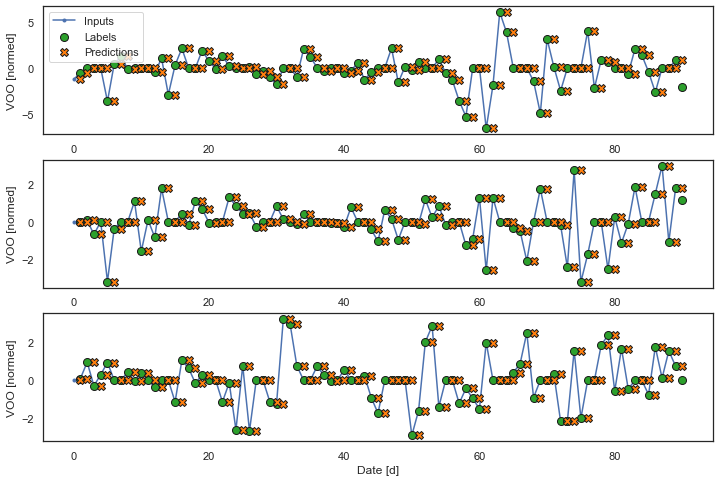

In [166]:
# Plotting the baseline model's predictions you can see that it is simply the labels, shifted right by 1h.

wide_window.plot(baseline,target_etf)

In [167]:
# Linear model
linear = tf.keras.Sequential([
    tf.keras.layers.Dense(units=1)
])

In [168]:
print('Input shape:', single_step_window.example[0].shape)
print('Output shape:', linear(single_step_window.example[0]).shape)

Input shape: (32, 90, 30)
Output shape: (32, 90, 1)


In [169]:
MAX_EPOCHS = 20

def compile_and_fit(model, window, patience=2):
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')

    model.compile(loss=tf.losses.MeanSquaredError(),
                optimizer=tf.optimizers.Adam(),
                metrics=[tf.metrics.MeanAbsoluteError()])

    history = model.fit(window.train, epochs=MAX_EPOCHS,
                      validation_data=window.val,
                      callbacks=[early_stopping])
    
    return history

In [170]:
history = compile_and_fit(linear, single_step_window)

val_performance['Linear'] = linear.evaluate(single_step_window.val)
performance['Linear'] = linear.evaluate(single_step_window.test, verbose=0)

Epoch 1/20
58/58 [==============================] - 1s 7ms/step - loss: 1058123.7934 - mean_absolute_error: 108.4097 - val_loss: 526465.1875 - val_mean_absolute_error: 98.2290
Epoch 2/20
58/58 [==============================] - 0s 5ms/step - loss: 823145.5169 - mean_absolute_error: 95.8016 - val_loss: 401799.0000 - val_mean_absolute_error: 85.5796
Epoch 3/20
58/58 [==============================] - 0s 5ms/step - loss: 637975.8538 - mean_absolute_error: 83.4491 - val_loss: 296945.6562 - val_mean_absolute_error: 73.4281
Epoch 4/20
58/58 [==============================] - 0s 5ms/step - loss: 458319.0932 - mean_absolute_error: 71.2671 - val_loss: 216271.6250 - val_mean_absolute_error: 62.6901
Epoch 5/20
58/58 [==============================] - 0s 5ms/step - loss: 332822.7283 - mean_absolute_error: 60.3172 - val_loss: 153864.6875 - val_mean_absolute_error: 53.1761
Epoch 6/20
58/58 [==============================] - 0s 5ms/step - loss: 239352.4523 - mean_absolute_error: 51.4171 - val_loss: 1

In [171]:
print('Input shape:', wide_window.example[0].shape)
print('Output shape:', baseline(wide_window.example[0]).shape)


Input shape: (32, 90, 30)
Output shape: (32, 90, 1)


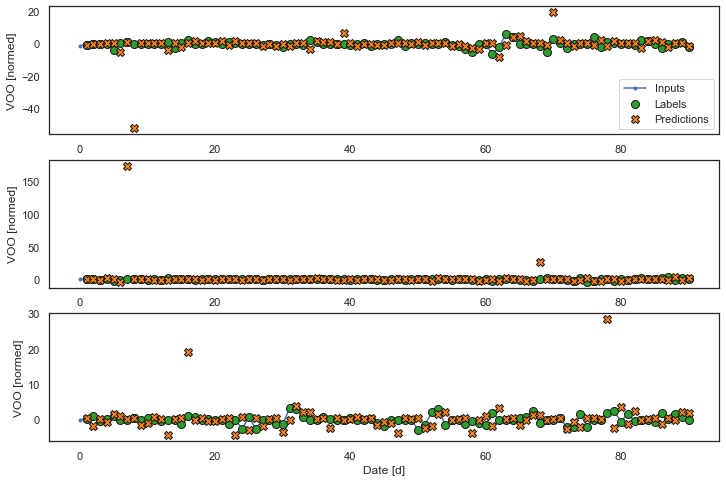

In [172]:
wide_window.plot(linear,target_etf)


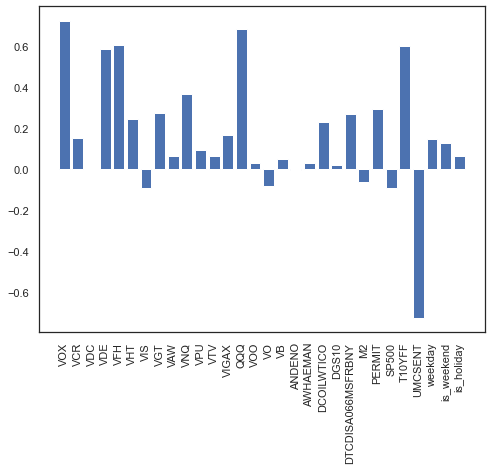

In [173]:
# pull out the layer's weights, and see the weight assigned to each input:
plt.bar(x = range(len(train_df.columns)),
        height=linear.layers[0].kernel[:,0].numpy())
axis = plt.gca()
axis.set_xticks(range(len(train_df.columns)))
_ = axis.set_xticklabels(train_df.columns, rotation=90)

In [174]:
# Dense
# checking the performance of deeper, more powerful, single input step models.
dense = tf.keras.Sequential([
    tf.keras.layers.Dense(units=64, activation='relu'),
    tf.keras.layers.Dense(units=64, activation='relu'),
    tf.keras.layers.Dense(units=1)
])

history = compile_and_fit(dense, single_step_window)

val_performance['Dense'] = dense.evaluate(single_step_window.val)
performance['Dense'] = dense.evaluate(single_step_window.test, verbose=0)

Epoch 1/20
58/58 [==============================] - 1s 9ms/step - loss: 6530.0276 - mean_absolute_error: 5.5481 - val_loss: 56.7859 - val_mean_absolute_error: 2.7458
Epoch 2/20
58/58 [==============================] - 0s 7ms/step - loss: 24.2082 - mean_absolute_error: 1.0910 - val_loss: 21.0706 - val_mean_absolute_error: 2.4265
Epoch 3/20
58/58 [==============================] - 0s 7ms/step - loss: 2.3184 - mean_absolute_error: 0.8161 - val_loss: 20.3720 - val_mean_absolute_error: 2.4020
Epoch 4/20
58/58 [==============================] - 0s 7ms/step - loss: 2.1651 - mean_absolute_error: 0.8366 - val_loss: 19.9790 - val_mean_absolute_error: 2.3907
Epoch 5/20
58/58 [==============================] - 1s 9ms/step - loss: 2.1636 - mean_absolute_error: 0.8204 - val_loss: 19.2804 - val_mean_absolute_error: 2.3428
Epoch 6/20
58/58 [==============================] - 0s 8ms/step - loss: 1.9632 - mean_absolute_error: 0.8069 - val_loss: 19.0330 - val_mean_absolute_error: 2.3594
Epoch 7/20
58/58 [

In [175]:
CONV_WIDTH = n_input_width
conv_window = WindowGenerator(
    input_width=CONV_WIDTH,
    label_width=1,
    shift=1,
    label_columns=[target_etf])

conv_window

Total window size: 91
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89]
Label indices: [90]
Label column name(s): ['VOO']

Text(0.5, 1.0, 'Given 90d as input, predict 1d into the future.')

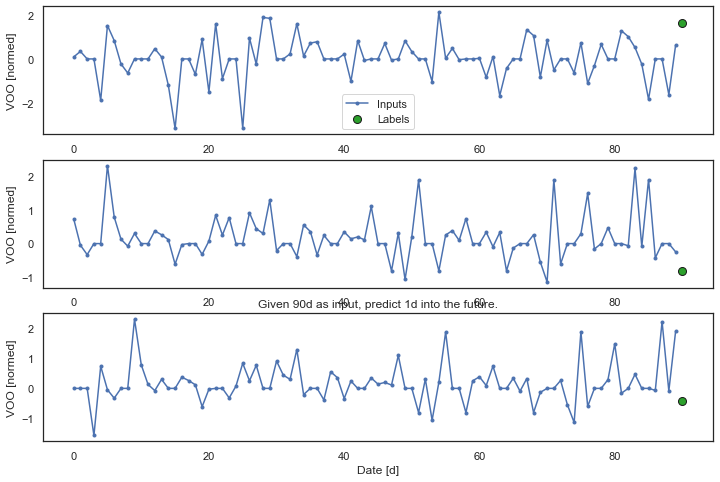

In [176]:
conv_window.plot(plot_col=target_etf)
plt.title(f"Given {n_input_width}d as input, predict 1d into the future.")

In [177]:
# multi step dense
multi_step_dense = tf.keras.Sequential([
    # Shape: (time, features) => (time*features)
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=32, activation='relu'),
    tf.keras.layers.Dense(units=32, activation='relu'),
    tf.keras.layers.Dense(units=1),
    # Add back the time dimension.
    # Shape: (outputs) => (1, outputs)
    tf.keras.layers.Reshape([1, -1]),
])

In [178]:
print('Input shape:', conv_window.example[0].shape)
print('Output shape:', multi_step_dense(conv_window.example[0]).shape)

Input shape: (32, 90, 30)
Output shape: (32, 1, 1)


In [179]:
history = compile_and_fit(multi_step_dense, conv_window)

IPython.display.clear_output()
val_performance['Multi step dense'] = multi_step_dense.evaluate(conv_window.val)
performance['Multi step dense'] = multi_step_dense.evaluate(conv_window.test, verbose=0)

15/15 [==============================] - 0s 3ms/step - loss: 1977.5477 - mean_absolute_error: 28.4958


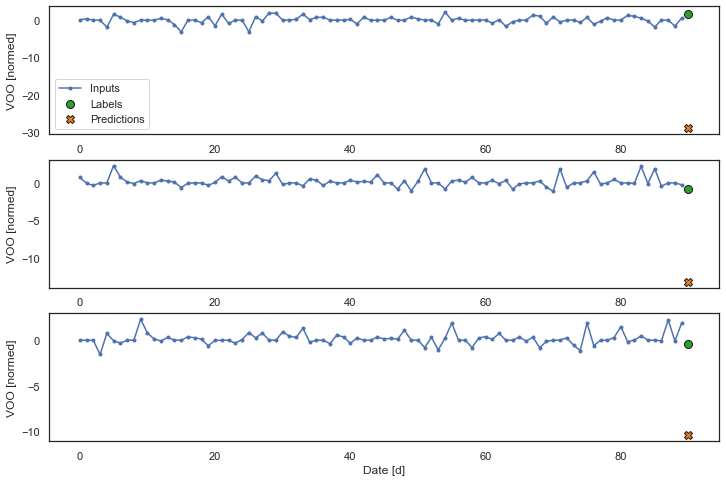

In [180]:
conv_window.plot(multi_step_dense, target_etf)

In [181]:
print('Input shape:', wide_window.example[0].shape)
try:
    print('Output shape:', multi_step_dense(wide_window.example[0]).shape)
except Exception as e:
    print(f'\n{type(e).__name__}:{e}')

Input shape: (32, 90, 30)
Output shape: (32, 1, 1)


In [182]:
# Convolution neural network
conv_model = tf.keras.Sequential([
    tf.keras.layers.Conv1D(filters=32,
                           kernel_size=(CONV_WIDTH,),
                           activation='relu'),
    tf.keras.layers.Dense(units=32, activation='relu'),
    tf.keras.layers.Dense(units=1),
])

In [183]:
print("Conv model on `conv_window`")
print('Input shape:', conv_window.example[0].shape)
print('Output shape:', conv_model(conv_window.example[0]).shape)

Conv model on `conv_window`
Input shape: (32, 90, 30)
Output shape: (32, 1, 1)


In [184]:
history = compile_and_fit(conv_model, conv_window)

IPython.display.clear_output()
val_performance['Conv'] = conv_model.evaluate(conv_window.val)
performance['Conv'] = conv_model.evaluate(conv_window.test, verbose=0)

15/15 [==============================] - 0s 3ms/step - loss: 2254.2305 - mean_absolute_error: 29.5828


In [185]:
print("Wide window")
print('Input shape:', wide_window.example[0].shape)
print('Labels shape:', wide_window.example[1].shape)
print('Output shape:', conv_model(wide_window.example[0]).shape)


Wide window
Input shape: (32, 90, 30)
Labels shape: (32, 90, 1)
Output shape: (32, 1, 1)


In [186]:
LABEL_WIDTH = n_input_width
INPUT_WIDTH = LABEL_WIDTH + (CONV_WIDTH - 1)
wide_conv_window = WindowGenerator(
    input_width=INPUT_WIDTH,
    label_width=LABEL_WIDTH,
    shift=1,
    label_columns=[target_etf])

wide_conv_window

Total window size: 180
Input indices: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178]
Label indices: [ 90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 

In [187]:
print("Wide conv window")
print('Input shape:', wide_conv_window.example[0].shape)
print('Labels shape:', wide_conv_window.example[1].shape)
print('Output shape:', conv_model(wide_conv_window.example[0]).shape)

Wide conv window
Input shape: (32, 179, 30)
Labels shape: (32, 90, 1)
Output shape: (32, 90, 1)


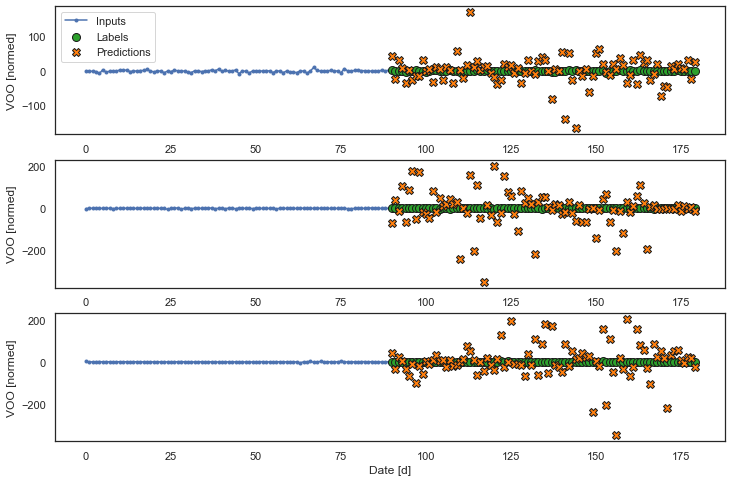

In [188]:
wide_conv_window.plot(conv_model,target_etf)


In [189]:
# Recurrent neural network
lstm_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.LSTM(32, return_sequences=True),
    # Shape => [batch, time, features]
    tf.keras.layers.Dense(units=1)
])

In [190]:
print('Input shape:', wide_window.example[0].shape)
print('Output shape:', lstm_model(wide_window.example[0]).shape)

Input shape: (32, 90, 30)
Output shape: (32, 90, 1)


In [191]:
history = compile_and_fit(lstm_model, wide_window)

IPython.display.clear_output()
val_performance['LSTM'] = lstm_model.evaluate(wide_window.val)
performance['LSTM'] = lstm_model.evaluate(wide_window.test, verbose=0)


15/15 [==============================] - 0s 8ms/step - loss: 16.5171 - mean_absolute_error: 2.2379


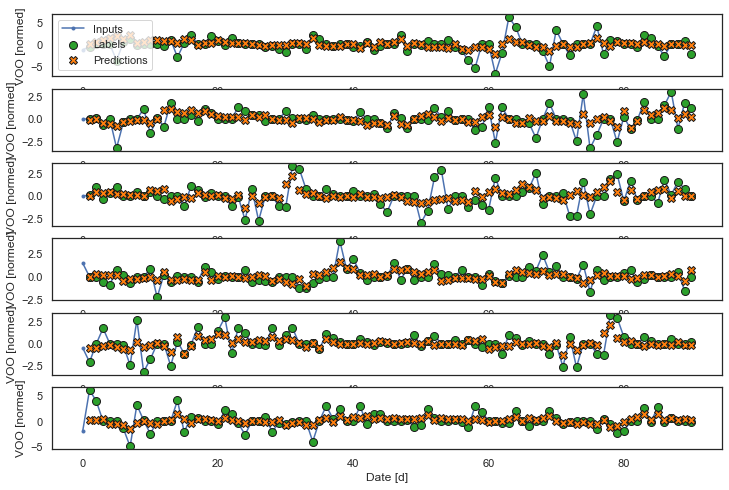

In [192]:
wide_window.plot(lstm_model,target_etf,max_subplots=6)

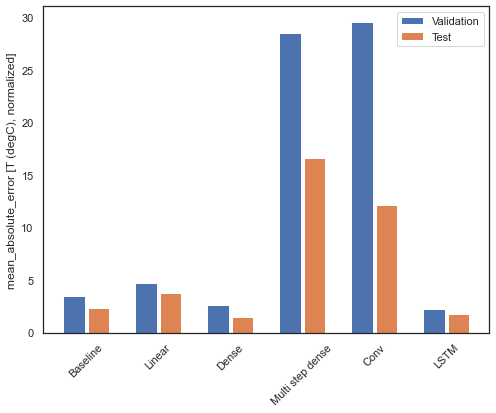

In [193]:
# Performance
x = np.arange(len(performance))
width = 0.3
metric_name = 'mean_absolute_error'
metric_index = lstm_model.metrics_names.index('mean_absolute_error')
val_mae = [v[metric_index] for v in val_performance.values()]
test_mae = [v[metric_index] for v in performance.values()]

plt.ylabel('mean_absolute_error [T (degC), normalized]')
plt.bar(x - 0.17, val_mae, width, label='Validation')
plt.bar(x + 0.17, test_mae, width, label='Test')
plt.xticks(ticks=x, labels=performance.keys(),
           rotation=45)
_ = plt.legend()

In [194]:
for name, value in performance.items():
    print(f'{name:12s}: {value[1]:0.4f}')

Baseline    : 2.3285
Linear      : 3.7544
Dense       : 1.4764
Multi step dense: 16.6418
Conv        : 12.1713
LSTM        : 1.7275


### Single step models

In [195]:
# Multi-output models
single_step_window = WindowGenerator(
    # `WindowGenerator` returns all features as labels if you 
    # don't set the `label_columns` argument.
    input_width=1, label_width=1, shift=1)

wide_window = WindowGenerator(
    input_width=n_input_width, label_width=n_input_width, shift=1)

for example_inputs, example_labels in wide_window.train.take(1):
    print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
    print(f'Labels shape (batch, time, features): {example_labels.shape}')

Inputs shape (batch, time, features): (32, 90, 30)
Labels shape (batch, time, features): (32, 90, 30)


In [196]:
baseline = Baseline()
baseline.compile(loss=tf.losses.MeanSquaredError(),
                 metrics=[tf.metrics.MeanAbsoluteError()])

In [197]:
val_performance = {}
performance = {}
val_performance['Baseline'] = baseline.evaluate(wide_window.val)
performance['Baseline'] = baseline.evaluate(wide_window.test, verbose=0)

15/15 [==============================] - 0s 2ms/step - loss: 264619.0322 - mean_absolute_error: 19.5345


In [198]:
dense = tf.keras.Sequential([
    tf.keras.layers.Dense(units=64, activation='relu'),
    tf.keras.layers.Dense(units=64, activation='relu'),
    tf.keras.layers.Dense(units=num_features)
])

In [199]:
history = compile_and_fit(dense, single_step_window)

IPython.display.clear_output()
val_performance['Dense'] = dense.evaluate(single_step_window.val)
performance['Dense'] = dense.evaluate(single_step_window.test, verbose=0)

18/18 [==============================] - 0s 1ms/step - loss: 119892.9141 - mean_absolute_error: 13.1139


In [200]:
%%time
wide_window = WindowGenerator(
    input_width=n_input_width, label_width=n_input_width, shift=1)

lstm_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.LSTM(32, return_sequences=True),
    # Shape => [batch, time, features]
    tf.keras.layers.Dense(units=num_features)
])

history = compile_and_fit(lstm_model, wide_window)

IPython.display.clear_output()
val_performance['LSTM'] = lstm_model.evaluate( wide_window.val)
performance['LSTM'] = lstm_model.evaluate( wide_window.test, verbose=0)

print()

15/15 [==============================] - 0s 9ms/step - loss: 128786.6953 - mean_absolute_error: 10.1410

CPU times: user 13.8 s, sys: 1.92 s, total: 15.8 s
Wall time: 8.84 s


In [201]:
class ResidualWrapper(tf.keras.Model):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def call(self, inputs, *args, **kwargs):
        delta = self.model(inputs, *args, **kwargs)

        # The prediction for each timestep is the input
        # from the previous time step plus the delta
        # calculated by the model.
        return inputs + delta

In [202]:
%%time
residual_lstm = ResidualWrapper(
    tf.keras.Sequential([
    tf.keras.layers.LSTM(32, return_sequences=True),
    tf.keras.layers.Dense(
        num_features,
        # The predicted deltas should start small
        # So initialize the output layer with zeros
        kernel_initializer=tf.initializers.zeros)
]))

history = compile_and_fit(residual_lstm, wide_window)

IPython.display.clear_output()
val_performance['Residual LSTM'] = residual_lstm.evaluate(wide_window.val)
performance['Residual LSTM'] = residual_lstm.evaluate(wide_window.test, verbose=0)
print()

15/15 [==============================] - 0s 7ms/step - loss: 257512.8438 - mean_absolute_error: 19.8248

CPU times: user 58.5 s, sys: 7.63 s, total: 1min 6s
Wall time: 36.8 s


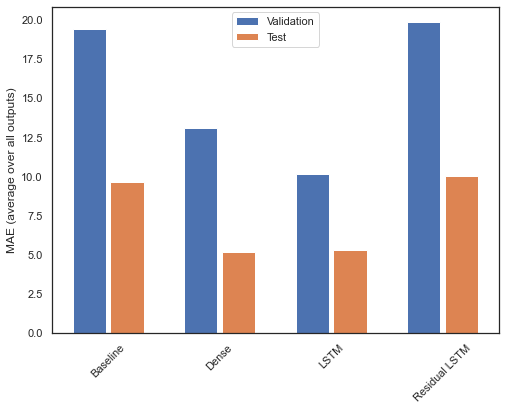

In [203]:
x = np.arange(len(performance))
width = 0.3

metric_name = 'mean_absolute_error'
metric_index = lstm_model.metrics_names.index('mean_absolute_error')
val_mae = [v[metric_index] for v in val_performance.values()]
test_mae = [v[metric_index] for v in performance.values()]

plt.bar(x - 0.17, val_mae, width, label='Validation')
plt.bar(x + 0.17, test_mae, width, label='Test')
plt.xticks(ticks=x, labels=performance.keys(),
           rotation=45)
plt.ylabel('MAE (average over all outputs)')
_ = plt.legend()

In [204]:
for name, value in performance.items():
    print(f'{name:15s}: {value[1]:0.4f}')

Baseline       : 9.6256
Dense          : 5.1634
LSTM           : 5.2964
Residual LSTM  : 10.0020


## Multi-step models

Total window size: 180
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89]
Label indices: [ 90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179]
Label column name(s): None

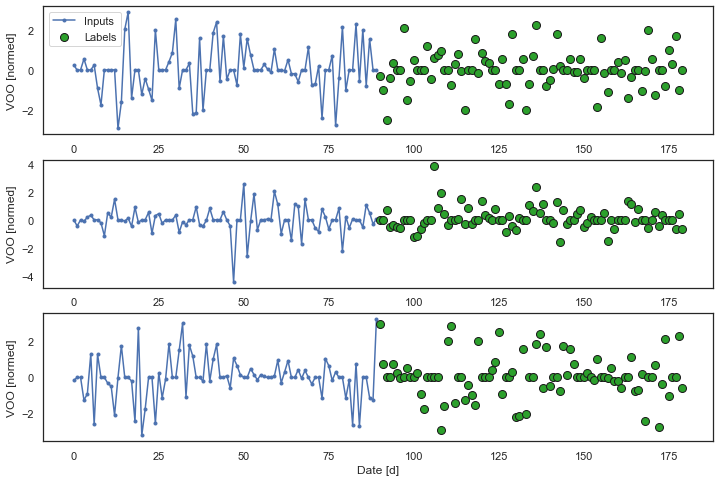

In [205]:
OUT_STEPS = n_input_width
multi_window = WindowGenerator(input_width=n_input_width,
                               label_width=OUT_STEPS,
                               shift=OUT_STEPS)

multi_window.plot(plot_col=target_etf)
multi_window

### Baseline

12/12 [==============================] - 0s 2ms/step - loss: 333632.6094 - mean_absolute_error: 23.1662


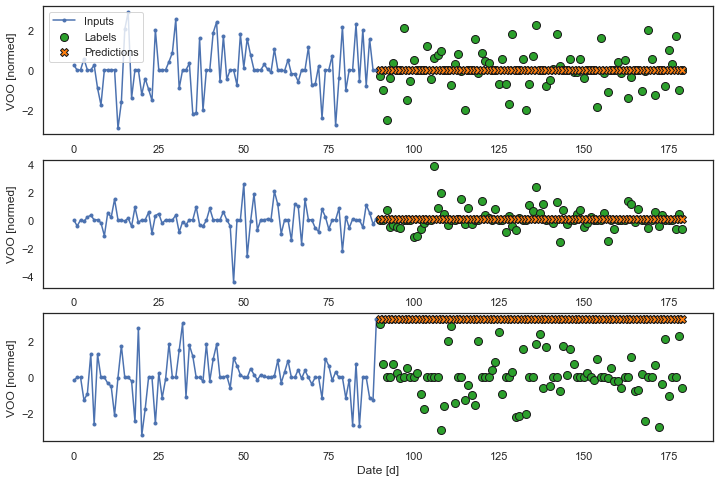

In [206]:
class MultiStepLastBaseline(tf.keras.Model):
    def call(self, inputs):
        return tf.tile(inputs[:, -1:, :], [1, OUT_STEPS, 1])

last_baseline = MultiStepLastBaseline()
last_baseline.compile(loss=tf.losses.MeanSquaredError(),
                      metrics=[tf.metrics.MeanAbsoluteError()])

multi_val_performance = {}
multi_performance = {}

multi_val_performance['Last'] = last_baseline.evaluate(multi_window.val)
multi_performance['Last'] = last_baseline.evaluate(multi_window.test, verbose=0)
multi_window.plot(last_baseline, plot_col=target_etf)

12/12 [==============================] - 0s 3ms/step - loss: 315523.8654 - mean_absolute_error: 21.3967


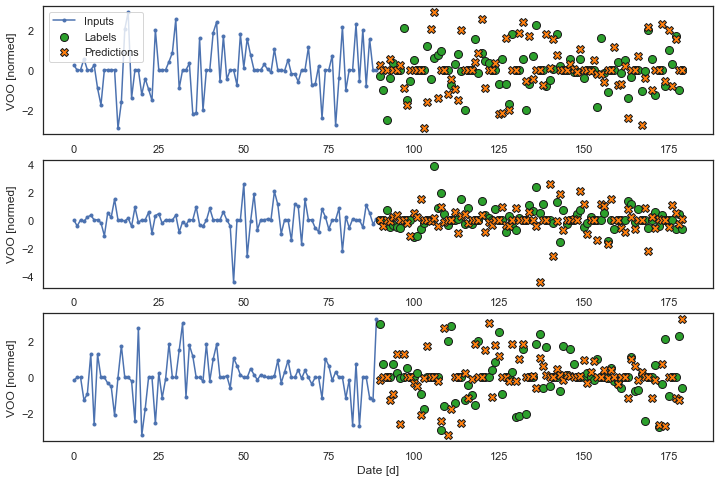

In [207]:
class RepeatBaseline(tf.keras.Model):
    def call(self, inputs):
        return inputs

repeat_baseline = RepeatBaseline()
repeat_baseline.compile(loss=tf.losses.MeanSquaredError(),
                        metrics=[tf.metrics.MeanAbsoluteError()])

multi_val_performance['Repeat'] = repeat_baseline.evaluate(multi_window.val)
multi_performance['Repeat'] = repeat_baseline.evaluate(multi_window.test, verbose=0)
multi_window.plot(repeat_baseline, plot_col=target_etf)

### Single-shot models

12/12 [==============================] - 0s 2ms/step - loss: 154005.8438 - mean_absolute_error: 12.5835


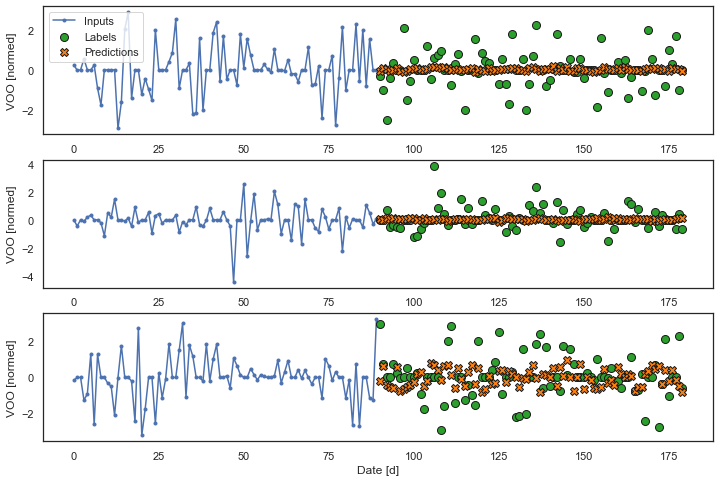

In [208]:
multi_linear_model = tf.keras.Sequential([
    # Take the last time-step.
    # Shape [batch, time, features] => [batch, 1, features]
    tf.keras.layers.Lambda(lambda x: x[:, -1:, :]),
    # Shape => [batch, 1, out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features,
                          kernel_initializer=tf.initializers.zeros),
    # Shape => [batch, out_steps, features]
    tf.keras.layers.Reshape([OUT_STEPS, num_features])
])

history = compile_and_fit(multi_linear_model, multi_window)

IPython.display.clear_output()
multi_val_performance['Linear'] = multi_linear_model.evaluate(multi_window.val)
multi_performance['Linear'] = multi_linear_model.evaluate(multi_window.test, verbose=0)
multi_window.plot(multi_linear_model, plot_col=target_etf)

### Dense

12/12 [==============================] - 0s 3ms/step - loss: 154101.4375 - mean_absolute_error: 13.2397


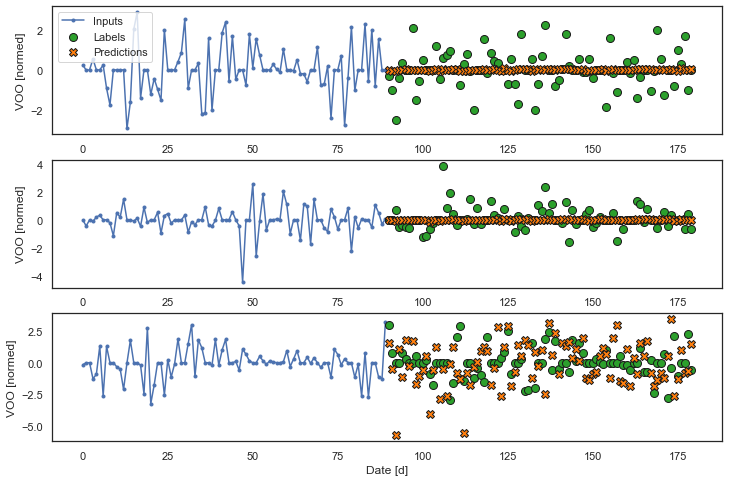

In [209]:
multi_dense_model = tf.keras.Sequential([
    # Take the last time step.
    # Shape [batch, time, features] => [batch, 1, features]
    tf.keras.layers.Lambda(lambda x: x[:, -1:, :]),
    # Shape => [batch, 1, dense_units]
    tf.keras.layers.Dense(512, activation='relu'),
    # Shape => [batch, out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features,
                          kernel_initializer=tf.initializers.zeros),
    # Shape => [batch, out_steps, features]
    tf.keras.layers.Reshape([OUT_STEPS, num_features])
])

history = compile_and_fit(multi_dense_model, multi_window)

IPython.display.clear_output()
multi_val_performance['Dense'] = multi_dense_model.evaluate(multi_window.val)
multi_performance['Dense'] = multi_dense_model.evaluate(multi_window.test, verbose=0)
multi_window.plot(multi_dense_model, plot_col=target_etf)

12/12 [==============================] - 0s 3ms/step - loss: 154213.8594 - mean_absolute_error: 15.3915


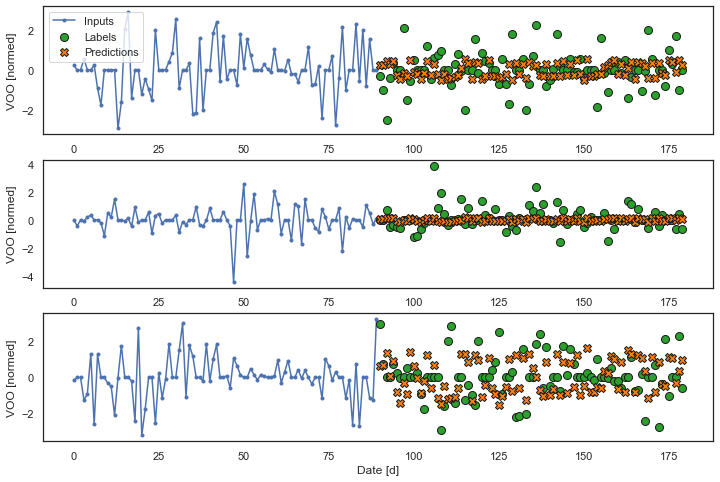

In [210]:
# CNN
CONV_WIDTH = 3
multi_conv_model = tf.keras.Sequential([
    # Shape [batch, time, features] => [batch, CONV_WIDTH, features]
    tf.keras.layers.Lambda(lambda x: x[:, -CONV_WIDTH:, :]),
    # Shape => [batch, 1, conv_units]
    tf.keras.layers.Conv1D(256, activation='relu', kernel_size=(CONV_WIDTH)),
    # Shape => [batch, 1,  out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features,
                          kernel_initializer=tf.initializers.zeros),
    # Shape => [batch, out_steps, features]
    tf.keras.layers.Reshape([OUT_STEPS, num_features])
])

history = compile_and_fit(multi_conv_model, multi_window)

IPython.display.clear_output()

multi_val_performance['Conv'] = multi_conv_model.evaluate(multi_window.val)
multi_performance['Conv'] = multi_conv_model.evaluate(multi_window.test, verbose=0)
multi_window.plot(multi_conv_model, plot_col=target_etf)

12/12 [==============================] - 0s 7ms/step - loss: 153903.5469 - mean_absolute_error: 11.1092


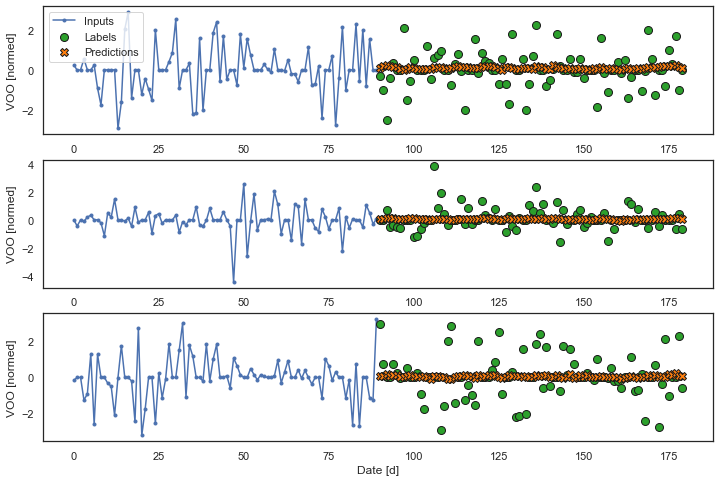

In [211]:
# RNN
multi_lstm_model = tf.keras.Sequential([
    # Shape [batch, time, features] => [batch, lstm_units]
    # Adding more `lstm_units` just overfits more quickly.
    tf.keras.layers.LSTM(32, return_sequences=False),
    # Shape => [batch, out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features,
                          kernel_initializer=tf.initializers.zeros),
    # Shape => [batch, out_steps, features]
    tf.keras.layers.Reshape([OUT_STEPS, num_features])
])

history = compile_and_fit(multi_lstm_model, multi_window)

IPython.display.clear_output()

multi_val_performance['LSTM'] = multi_lstm_model.evaluate(multi_window.val)
multi_performance['LSTM'] = multi_lstm_model.evaluate(multi_window.test, verbose=0)
multi_window.plot(multi_lstm_model, plot_col=target_etf)

### Advanced: Autoregressive model

In [212]:
class FeedBack(tf.keras.Model):
    def __init__(self, units, out_steps):
        super().__init__()
        self.out_steps = out_steps
        self.units = units
        self.lstm_cell = tf.keras.layers.LSTMCell(units)
        # Also wrap the LSTMCell in an RNN to simplify the `warmup` method.
        self.lstm_rnn = tf.keras.layers.RNN(self.lstm_cell, return_state=True)
        self.dense = tf.keras.layers.Dense(num_features)

In [213]:
feedback_model = FeedBack(units=32, out_steps=OUT_STEPS)

In [214]:
def warmup(self, inputs):
    # inputs.shape => (batch, time, features)
    # x.shape => (batch, lstm_units)
    x, *state = self.lstm_rnn(inputs)

    # predictions.shape => (batch, features)
    prediction = self.dense(x)
    return prediction, state

FeedBack.warmup = warmup

In [215]:
prediction, state = feedback_model.warmup(multi_window.example[0])
prediction.shape

TensorShape([32, 30])

In [216]:
def call(self, inputs, training=None):
    # Use a TensorArray to capture dynamically unrolled outputs.
    predictions = []
    # Initialize the lstm state
    prediction, state = self.warmup(inputs)

    # Insert the first prediction
    predictions.append(prediction)

    # Run the rest of the prediction steps
    for n in range(1, self.out_steps):
        # Use the last prediction as input.
        x = prediction
        # Execute one lstm step.
        x, state = self.lstm_cell(x, states=state,
                                  training=training)
        # Convert the lstm output to a prediction.
        prediction = self.dense(x)
        # Add the prediction to the output
        predictions.append(prediction)

    # predictions.shape => (time, batch, features)
    predictions = tf.stack(predictions)
    # predictions.shape => (batch, time, features)
    predictions = tf.transpose(predictions, [1, 0, 2])
    return predictions

FeedBack.call = call

In [217]:
print('Output shape (batch, time, features): ', feedback_model(multi_window.example[0]).shape)

Output shape (batch, time, features):  (32, 90, 30)


12/12 [==============================] - 0s 13ms/step - loss: 153924.0000 - mean_absolute_error: 11.6875


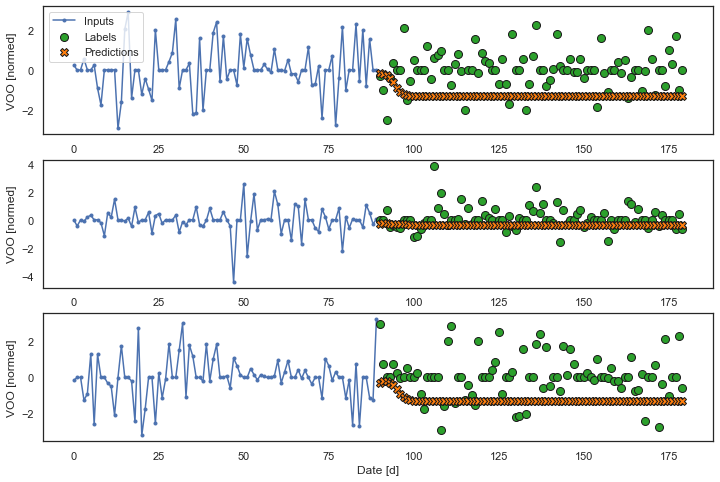

In [218]:
history = compile_and_fit(feedback_model, multi_window)

IPython.display.clear_output()

multi_val_performance['AR LSTM'] = feedback_model.evaluate(multi_window.val)
multi_performance['AR LSTM'] = feedback_model.evaluate(multi_window.test, verbose=0)
multi_window.plot(feedback_model, plot_col=target_etf)

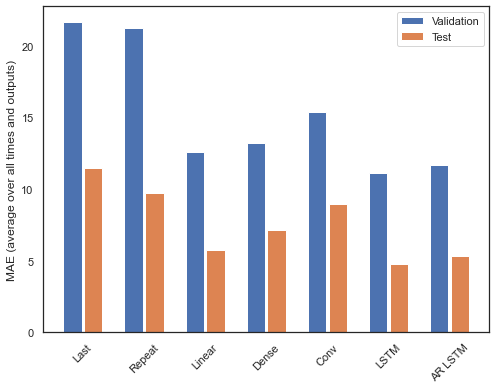

In [219]:
x = np.arange(len(multi_performance))
width = 0.3


metric_name = 'mean_absolute_error'
metric_index = lstm_model.metrics_names.index('mean_absolute_error')
val_mae = [v[metric_index] for v in multi_val_performance.values()]
test_mae = [v[metric_index] for v in multi_performance.values()]

plt.bar(x - 0.17, val_mae, width, label='Validation')
plt.bar(x + 0.17, test_mae, width, label='Test')
plt.xticks(ticks=x, labels=multi_performance.keys(),
           rotation=45)
plt.ylabel(f'MAE (average over all times and outputs)')
_ = plt.legend()

In [220]:
for name, value in multi_performance.items():
    print(f'{name:8s}: {value[1]:0.4f}')

Last    : 11.4695
Repeat  : 9.7538
Linear  : 5.7185
Dense   : 7.1282
Conv    : 8.9840
LSTM    : 4.7880
AR LSTM : 5.3573


### Predict

In [221]:
# transform data to create prediction

# final_window = single_step_window
# final_model = dense


final_window = wide_window
final_model = lstm_model

# final_window = multi_window
# final_model = multi_lstm_model #multi_lstm_model # or multi_linear_model #

final_window_size = final_window.input_width


# actual_df_std = (df - train_mean) / train_std
actual_df_std = df.diff(diff_order).dropna()
actual_df_std = actual_df_std[-final_window_size:]



In [222]:
# create prediction
def make_pred_dataset(self, data):
#     data = np.array(data, dtype=np.float32)
    ds = tf.keras.preprocessing.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.input_width,
      sequence_stride=1,
      shuffle=True,
      batch_size=32,)
    return ds

WindowGenerator.make_pred_dataset = make_pred_dataset

predictions = final_model.predict(final_window.make_pred_dataset(actual_df_std))
# predictions = final_model.predict([np.array(actual_df_std, dtype=np.float32)])
print("predictions shape:", predictions.shape)   

predictions shape: (1, 90, 30)


In [223]:
# reverse the prediction
predictions_reversed = pd.DataFrame(data = predictions[0],columns=plot_cols)
# method to reverse prediction to the original scale as we used 1 degree difference to preprocess data
predictions_reversed = np.cumsum(predictions_reversed,axis=0)  + df[-1:].values
# method to reverse prediction to the original scale if we used normalization to preprocess data
# predictions_reversed = predictions_reversed*train_std+train_mean

predictions_reversed.index = pd.date_range(forecast_start_date,periods=predictions_reversed.shape[0],freq='D').date

In [224]:
# compare current with predicted future
current_reversed = df.copy()
# current_reversed = actual_df_std.copy()
current = current_reversed[etf_list].tail(1).values
# current = current_reversed[etf_list].tail(3).mean()
future1 = np.array(predictions_reversed[etf_list].mean())
future2 = predictions_reversed[etf_list].tail(1).values
future_tomorrow = predictions_reversed[etf_list].head(1).values

In [225]:
print("The higher the percentage of increase, the lower the number of rank:")
pd.DataFrame(data={'etf':etf_list,
                   '% change by mean':(future1/current-1)[0], 
                   'change by mean':(future1-current)[0], 
                   'rank1': len(etf_list)+1-rankdata((future1/current-1)[0], method='min'),
                   '% change by last value':(future2/current-1)[0],
                    'change by last value':(future2-current)[0],
                  'rank2': len(etf_list)+1-rankdata((future2/current-1)[0], method='min'),
                    '% change by tomorrow':(future_tomorrow/current-1)[0],
                  'rank3': len(etf_list)+1-rankdata((future_tomorrow/current-1)[0], method='min')
                  })


The higher the percentage of increase, the lower the number of rank:


,etf,% change by mean,change by mean,rank1,% change by last value,change by last value,rank2,% change by tomorrow,rank3
0,VOX,-0.0293,-4.2091,17,-0.0227,-3.2658,17,-0.0002,15
1,VCR,0.0122,3.8270,8,0.0376,11.7975,6,0.0000,12
2,VDC,0.0188,3.4356,5,0.0272,4.9582,7,0.0000,10
3,VDE,0.0096,0.7262,11,0.0251,1.9034,9,0.0008,1
4,VFH,0.0486,4.3992,1,0.1320,11.9426,1,0.0002,5
5,VHT,-0.0116,-2.8756,15,-0.0045,-1.1141,14,0.0002,6
6,VIS,0.0182,3.5849,6,0.0568,11.1531,3,0.0002,4
7,VGT,0.0079,3.1627,12,0.0179,7.1480,11,-0.0000,13
8,VAW,0.0417,7.5427,2,0.0901,16.2858,2,-0.0001,14
9,VNQ,-0.0194,-1.9751,16,-0.0116,-1.1788,15,0.0006,3


In [226]:
# plot the current and predicted future
final_actual = current_reversed[etf_list+leading_metric_list].copy()
final_actual['Type'] = 'Actual'
final_pred = predictions_reversed[etf_list+leading_metric_list].copy()
final_pred['Type'] = 'Prediction'

final_df = final_actual.append(final_pred)
final_df['Created Date']=train_end_date

In [227]:
# store the actual and prediction
final_df.to_csv(os.path.join(project_dir, f'data/processed/ts_leading_metric_impact_on_sectors_pred_{train_end_date}.csv'), encoding='utf-8', index=False)


## Visualization

In [228]:
# visualize ETFs
# colors
palette = cycle(px.colors.qualitative.Bold)

max_y = final_df[etf_list].max().max()
n_digit = 10 ** (len(str(int(max_y)))-1)
data = []
for etf in etf_list:
    trace_color = next(palette)
    # TODO: add ETF name
    trace_actual = go.Scatter(x=final_actual.index, y=final_actual[etf],
                    mode='lines',
                    name=f'{etf}-actual',
                             line=go.Line(color=trace_color,
                                         width=1.5,))
    trace_pred = go.Scatter(x=final_pred.index, y=final_pred[etf],
                    mode='lines',
                    name=f'{etf}-prediction',
                           line=go.Line(color=trace_color,
                                       width=1.5,
                                       dash='dashdot'))
    data.append(trace_actual)
    data.append(trace_pred)

layout = go.Layout(title='ETF',
                  xaxis=dict(title='Date'),
                  yaxis=dict(title='Value'))
layout.update(dict(shapes=[
    {
        'type':'line',
        'x0':train_end_date,
        'y0':0,
        'x1':train_end_date,
        'y1':np.ceil(max_y/n_digit)*n_digit,
        'line':{
            'color':'#909090',
            'width':1
        }
        
    }
]))
layout.update(dict(annotations=[
    go.Annotation(text='End of training',
                 x=train_end_date,
                 y=np.floor(max_y/n_digit)*n_digit
                  )
]))
fig = go.Figure(data = data,layout=layout)

fig.show()

In [229]:
# visualize leading metrics


# colors
palette = cycle(px.colors.qualitative.Vivid)

max_y = final_df[leading_metric_list].max().max()
n_digit = 10 ** (len(str(int(max_y)))-1)
data = []
for leading_metric in leading_metric_list:
    trace_color = next(palette)
    trace_actual = go.Scatter(x=final_actual.index, y=final_actual[leading_metric],
                    mode='lines',
                    name=f'{leading_metric}-actual',
                             line=go.Line(color=trace_color,
                                         width=1.5,))
    trace_pred = go.Scatter(x=final_pred.index, y=final_pred[leading_metric],
                    mode='lines',
                    name=f'{leading_metric}-prediction',
                           line=go.Line(color=trace_color,
                                       width=1.5,
                                       dash='dashdot'))
    data.append(trace_actual)
    data.append(trace_pred)

layout = go.Layout(title='Leading Metrics',
                  xaxis=dict(title='Date'),
                  yaxis=dict(title='Value'))
layout.update(dict(shapes=[
    {
        'type':'line',
        'x0':train_end_date,
        'y0':0,
        'x1':train_end_date,
        'y1':np.ceil(max_y/n_digit)*n_digit,
        'line':{
            'color':'#909090',
            'width':1
        }
        
    }
]))
layout.update(dict(annotations=[
    go.Annotation(text='End of training',
                 x=train_end_date,
                 y=np.floor(max_y/n_digit)*n_digit
                  )
]))
fig = go.Figure(data = data,layout=layout)

fig.show()